In [1]:
import numpy as np
import scipy as sp
from scipy import stats
import pandas as pd
import pylab as pl

%pylab inline
pl.rcParams['figure.figsize'] = (10,10)
pl.rcParams['font.size'] = 20

import sklearn

from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets.samples_generator import make_blobs
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances


Populating the interactive namespace from numpy and matplotlib


In [2]:
import sys
!{sys.executable} -m pip install astroml

In [3]:
!{sys.executable} -m pip install update sklearn

In [4]:
sklearn.__file__

'/Users/fbb/anaconda3/lib/python3.7/site-packages/sklearn/__init__.py'

# read in data

(2500, 3, 100)


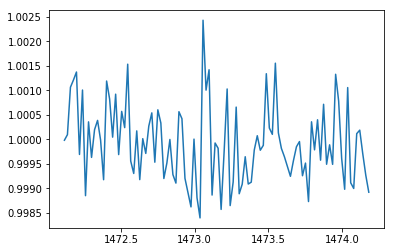

In [5]:
lcvsKep = np.load("../data/KeplerSampleWErr.npy")
print(lcvsKep.shape)
pl.plot(lcvsKep[10,0], lcvsKep[10,1])



In [6]:
lcvsKepNormed = lcvsKep.copy()

In [7]:
# cant standardize due to spikes...
lcvsKepNormed[:,1] = (lcvsKep[:,1] - np.atleast_2d(lcvsKep[:,1].mean(axis=1)).T ) / np.atleast_2d(lcvsKep[:,1].std(axis=1)).T
                    

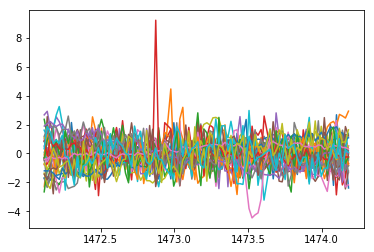

In [8]:
np.random.seed(666)
seleted = random.choice(np.arange(lcvsKep.shape[0]), size=30, replace=False) 
for lcv in seleted:
    pl.plot(lcvsKepNormed[lcv, 0], lcvsKepNormed[lcv, 1])


# remove spikes by low pass filter
I am saving each set of lightcurves: 

Noramlized by not preprocessed (standardized, mean subtracted)

Spikes removes, no other filter

Low pass filtered



In [9]:
lcvsKep[:,1,:].shape
M = lcvsKep.copy()
S = lcvsKep.copy()

M0 = lcvsKep.copy()
S0 = lcvsKep.copy()
M[0,1].shape

(100,)

In [10]:
pd.core.window.Rolling.mean?

In [11]:
# replacing spikes: low pass filter
for i in range(len(lcvsKep)):
    roller = pd.Series(lcvsKep[i,1]).rolling(min_periods=1, window=10, center=True)
    M0[i,1] = roller.median()
    S0[i,1] = roller.std()
#notnan = (~np.isnan(M[:,1]))[0]
#M = M[:,:,notnan]
#S = S[:,:,notnan]

lcvsKepLP = M0


In [12]:
# removing outliers
for i in range(len(lcvsKep)):
    roller = pd.Series(lcvsKep[i,1]).rolling(min_periods=1, window=15, center=True)
    M[i,1] = roller.median()
    S[i,1] = roller.std()
notnan = (~np.isnan(M[:,1]))[0]
M = M[:,:,notnan]
S = S[:,:,notnan]

lcvsKepfixed = lcvsKep[:,:,notnan].copy()
badpoints = (np.abs(lcvsKepfixed[:,1] - M[:,1]) > 3 * S[:,1] )
lcvsKepfixed[:,1][badpoints] = M[:,1][badpoints]

# re-normalize

In [13]:
#normalizing but not standardizing
lcvsKepfixed[:,1] = (lcvsKepfixed[:,1] / 
                     np.atleast_2d(lcvsKepfixed[:,1].mean(axis=1)).T ) 
#/np.atleast_2d(Xfixed[:,1].std(axis=1)).T


In [14]:
lcvsKepLP[:,1] = (lcvsKepLP[:,1] / 
                        np.atleast_2d(lcvsKepLP[:,1].mean(axis=1)).T ) 


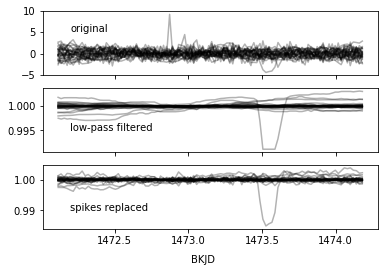

In [15]:
##### pl.rcParams['font.size'] = 15
fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, sharex=True)


for lcv in seleted[:30]:
    ax1.plot(lcvsKepNormed[lcv, 0], lcvsKepNormed[lcv, 1], color="k", alpha=0.3)
    ax2.plot(lcvsKepLP[lcv, 0], lcvsKepLP[lcv, 1], color="k", alpha=0.3)
    ax3.plot(lcvsKepfixed[lcv, 0], lcvsKepfixed[lcv, 1], color="k", alpha=0.3)
ax1.text(1472.2, 5, "original", ha="left")
ax2.text(1472.2, 0.995, "low-pass filtered", ha="left")
ax3.text(1472.2, 0.99, "spikes replaced", ha="left")
ax3.text(1473.1, 0.973, "BKJD", ha="center")
ax1.set_xticks([1472.5, 1473, 1473.5,1474], ['','','','',''])
ax2.set_xticks([1472.5, 1473, 1473.5,1474], ['','','','',''])

pl.savefig("figures/lcvexamples.png")

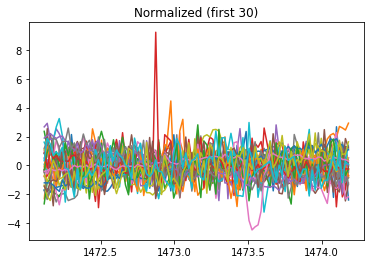

In [16]:
for lcv in seleted[:30]:
    pl.plot(lcvsKepNormed[lcv, 0], lcvsKepNormed[lcv, 1])
pl.title("Normalized (first 30)");

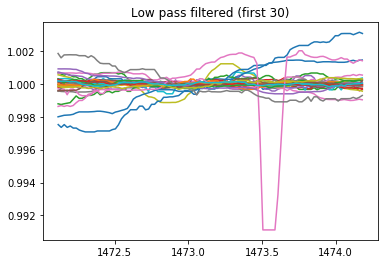

In [17]:
for lcv in seleted:
    pl.plot(lcvsKepLP[lcv, 0], lcvsKepLP[lcv, 1])
pl.title("Low pass filtered (first 30)");

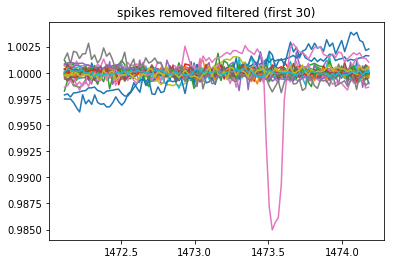

In [18]:
for lcv in seleted:
    pl.plot(lcvsKepfixed[lcv, 0], lcvsKepfixed[lcv, 1])
pl.title("spikes removed filtered (first 30)");

# Isolation forest

## parameters: 100 training sample, 10% outliers

In [19]:
clf = IsolationForest(max_samples=256, contamination=0.1, random_state=100)

In [20]:
clf.fit(lcvsKepNormed[:,1,:]) #, sample_weight=1.0/(Xfixed[:,2,:])**2)
scores_pred_Norm = clf.decision_function(lcvsKepNormed[:,1,:])
#scores_pred_Norm = clf.score_samples(lcvsKepNormed[:,1,:])
#.sample_score(lcvsKepNormed[:,1,:])

threshold_Norm  = stats.scoreatpercentile(scores_pred_Norm ,
                                100 * 0.1)
y_predNorm = clf.predict(lcvsKepNormed[:,1,:])


/Users/fbb/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/iforest.py:223: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
/Users/fbb/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/iforest.py:417: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)


In [21]:
clf.fit(lcvsKepLP[:,1,:])#, sample_weight=1.0/(Xfixed[:,2,:])**2)
scores_pred_LP = clf.decision_function(lcvsKepLP[:,1,:])
threshold_LP = stats.scoreatpercentile(scores_pred_LP,
                                100 * 0.1)
y_predLP = clf.predict(lcvsKepLP[:,1,:])


/Users/fbb/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/iforest.py:223: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
/Users/fbb/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/iforest.py:417: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)


In [22]:
clf.fit(lcvsKepfixed[:,1,:])#, sample_weight=1.0/(Xfixed[:,2,:])**2)
scores_pred_fixed = clf.decision_function(lcvsKepfixed[:,1,:])
threshold_fixed = stats.scoreatpercentile(scores_pred_fixed,
                                100 * 0.1)
y_predfixed = clf.predict(lcvsKepfixed[:,1,:])


/Users/fbb/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/iforest.py:223: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
/Users/fbb/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/iforest.py:417: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)


Text(0, 0.5, 'low pass filtered score')

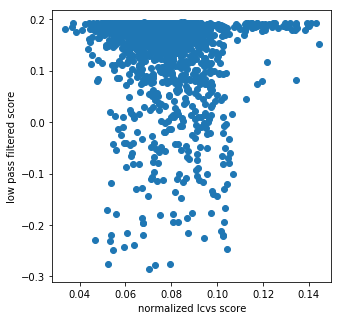

In [23]:
pl.figure(figsize=(5,5))
pl.plot(scores_pred_Norm, scores_pred_LP, 'o')
pl.xlabel("normalized lcvs score")
pl.ylabel("low pass filtered score")

technically the score needs to be negative for outliers, so the normalized set, with untouched noise, shows no outliers. the correlation between the scores is very weak, but statistically significant, and negative!

In [87]:
print("Perarsons test: correlation r between scores of normalized and LP filtered {0:.2f},  p-value {1:.2g}".format(
    *sp.stats.pearsonr(scores_pred_Norm, scores_pred_LP)))

Perarsons test: correlation r between scores of normalized and LP filtered -0.16,  p-value 3.3e-15


printing Normalized sample one every 300 lcvs in decreasing weirdness order


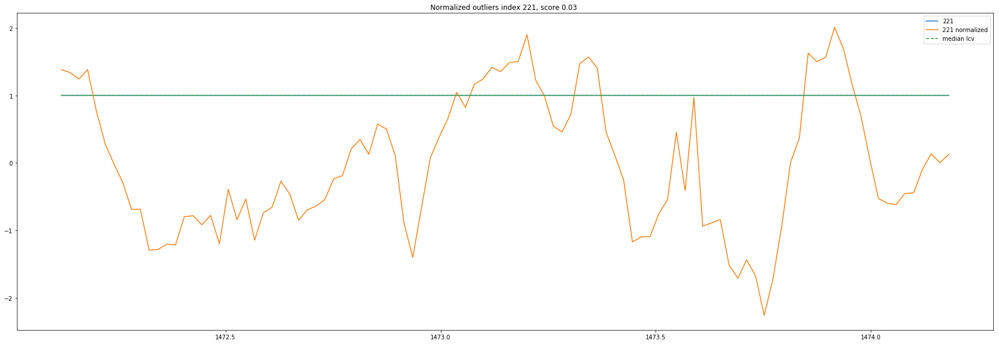

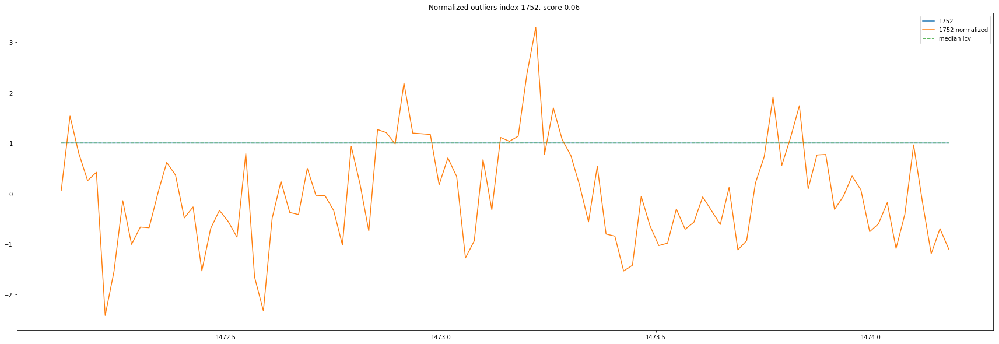

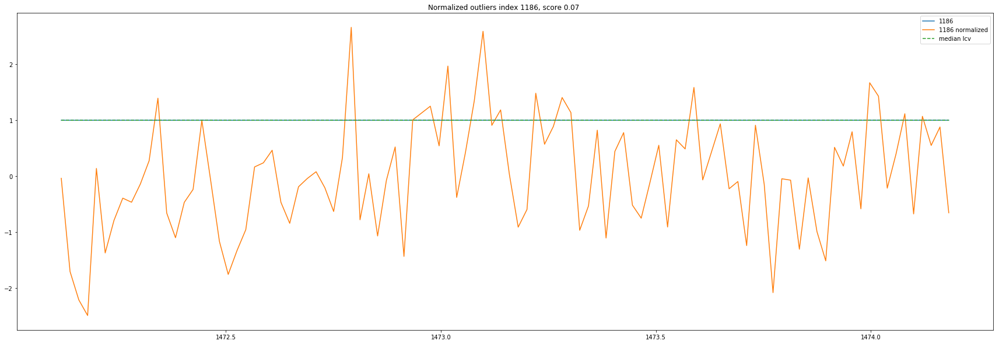

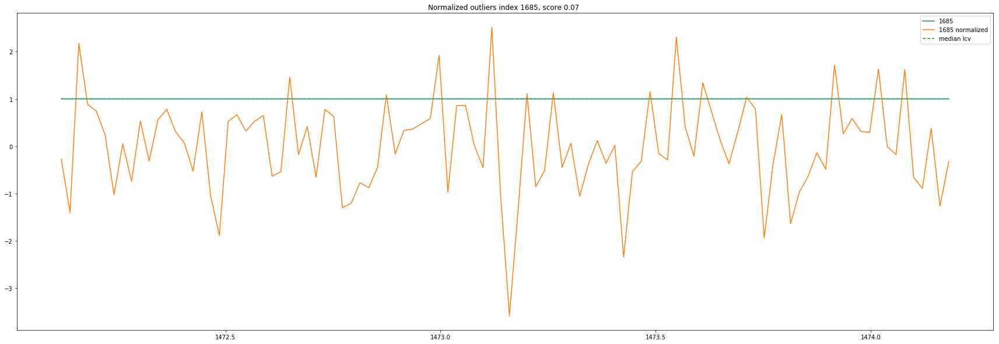

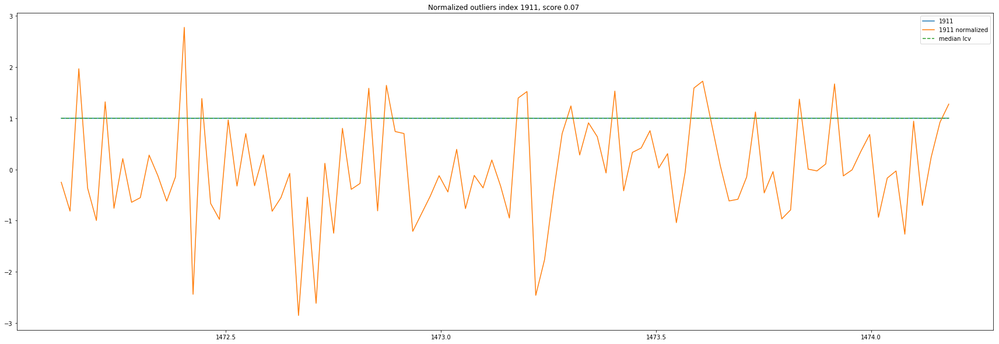

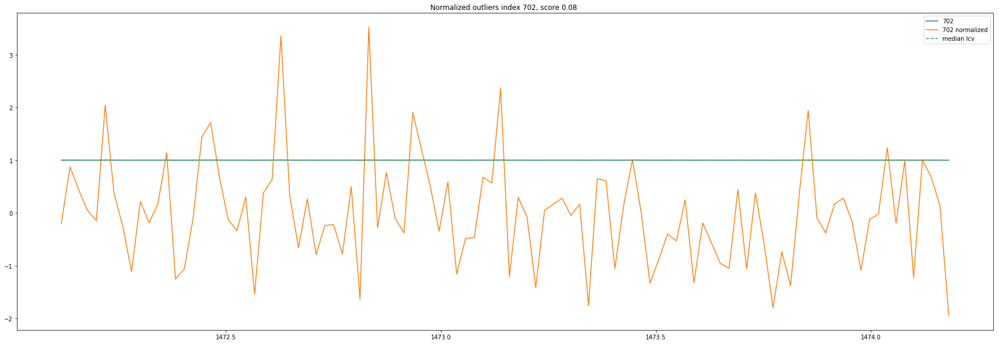

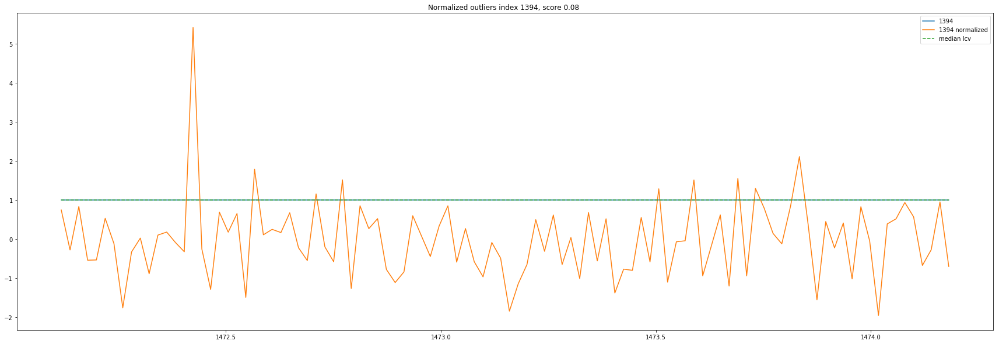

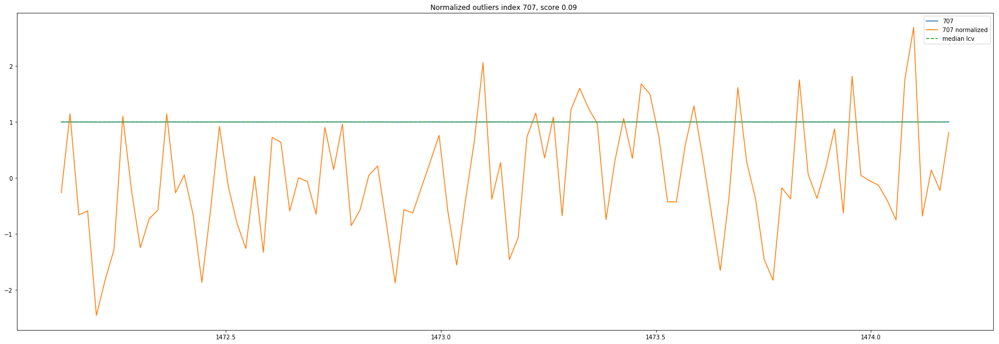

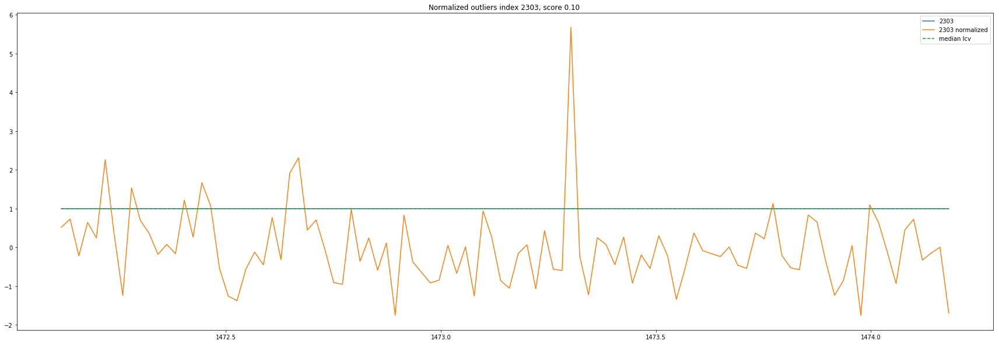

In [25]:
for i in np.argsort(scores_pred_Norm)[::300]:
    pl.figure(figsize=(30,10))
    pl.plot(lcvsKep[i,0], lcvsKep[i,1], '-', label="%i"%i)
    pl.plot(lcvsKepNormed[i,0], lcvsKepNormed[i,1], '-', label="%i normalized"%i)
    pl.plot(lcvsKep[i,0], np.median(lcvsKep[:,1], axis=0), '--', label="median lcv")
    pl.title("Normalized outliers index %d, score %.2f "%(i, scores_pred_Norm[i]))
    
    pl.legend()

print ("printing Normalized sample one every 300 lcvs in decreasing weirdness order")

showing Low Pass filter sample one every 300 lcvs in decreasing weirdness order


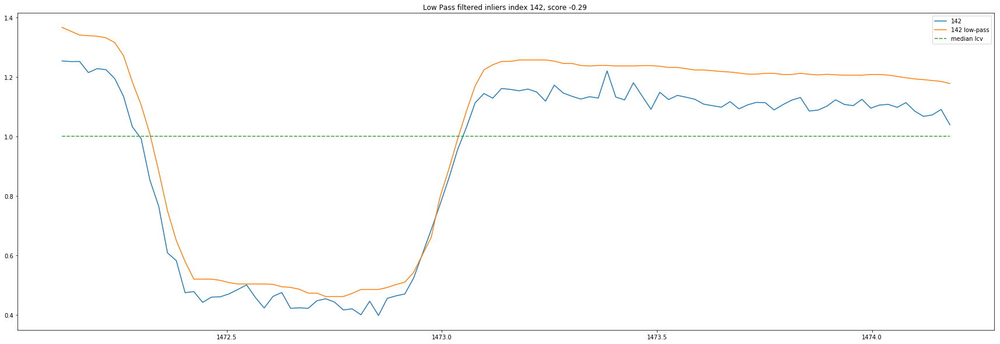

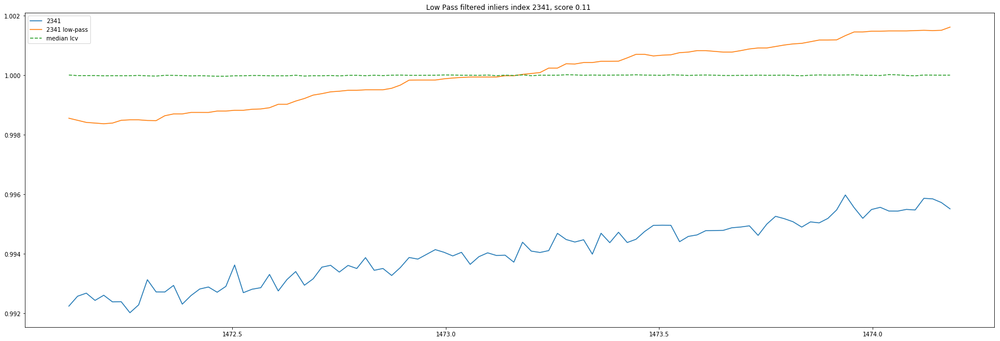

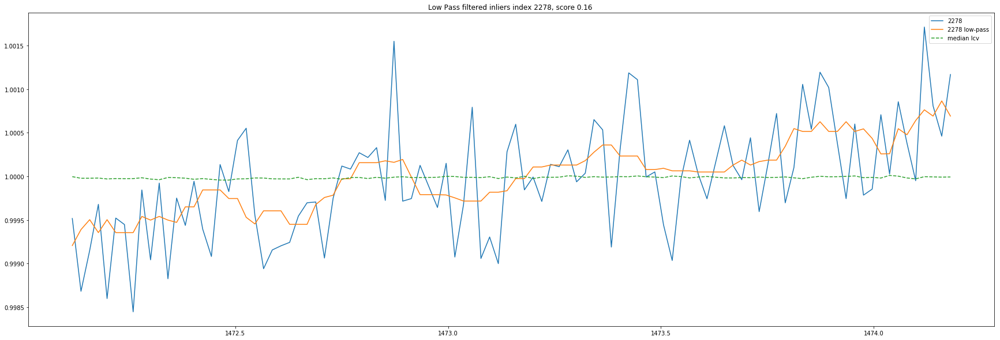

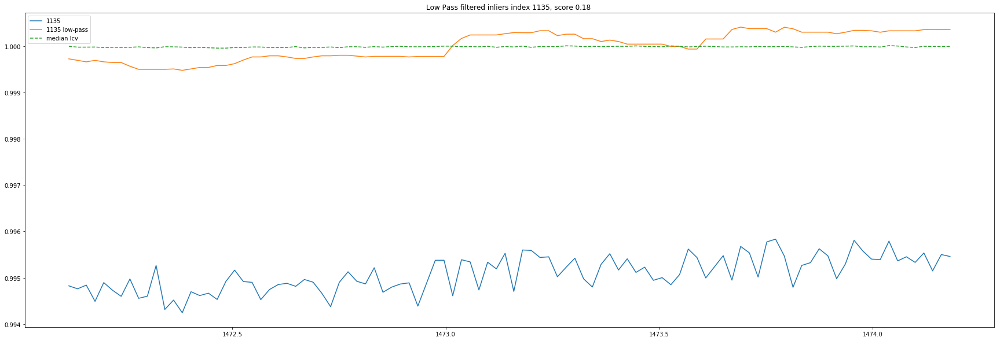

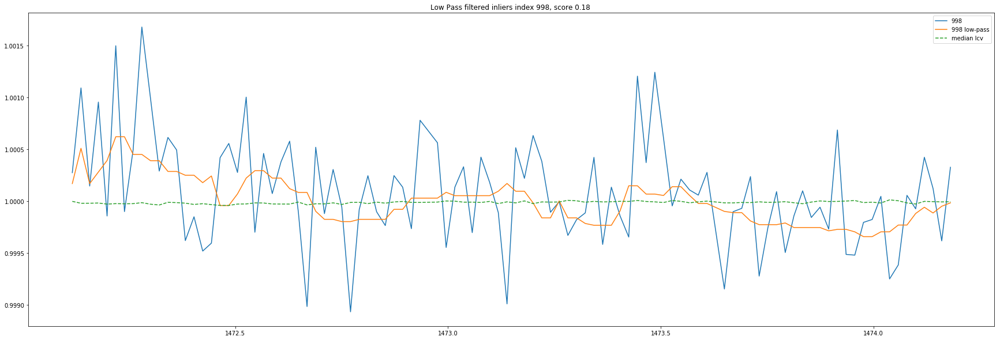

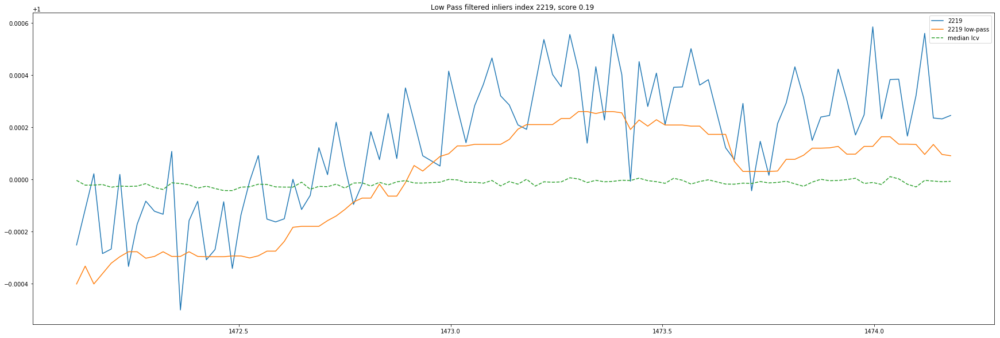

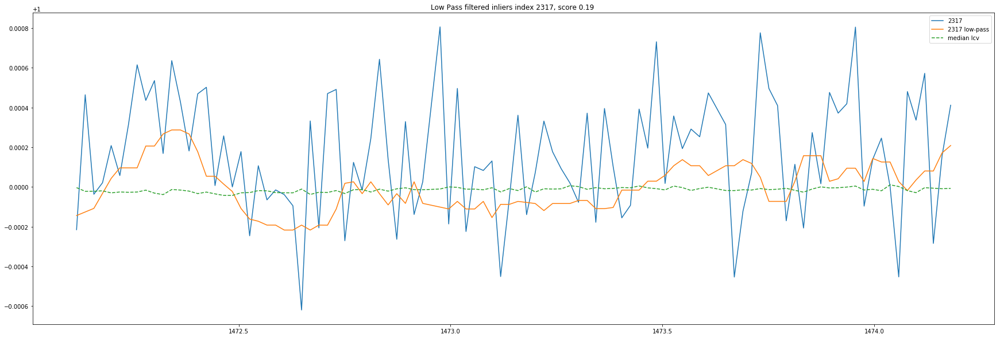

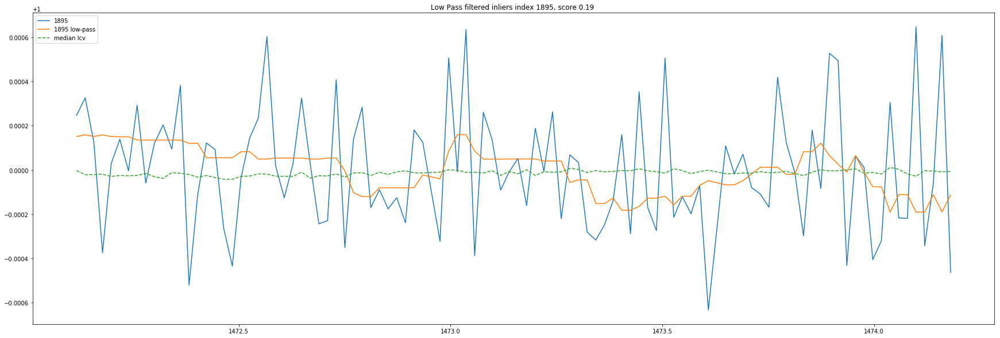

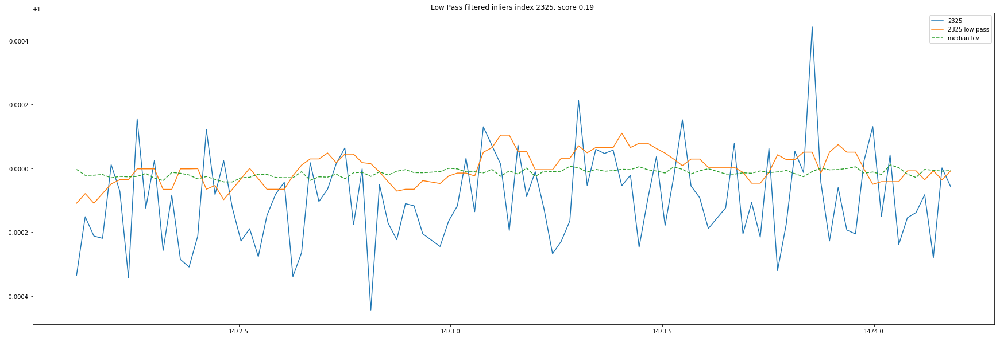

In [26]:
for i in np.argsort(scores_pred_LP)[::300]:
    pl.figure(figsize=(30,10))
    pl.plot(lcvsKep[i,0], lcvsKep[i,1], '-', label="%i"%i)
    pl.plot(lcvsKepLP[i,0], lcvsKepLP[i,1], '-', label="%i low-pass"%i)
    pl.plot(lcvsKep[i,0], np.median(lcvsKep[:,1], axis=0), '--', label="median lcv")
    pl.title("Low Pass filtered inliers index %d, score %.2f "%(i, scores_pred_LP[i]))
    
    pl.legend()

print ("showing Low Pass filter sample one every 300 lcvs in decreasing weirdness order")

printing Normalized sample one every 300 lcvs in decreasing weirdness order


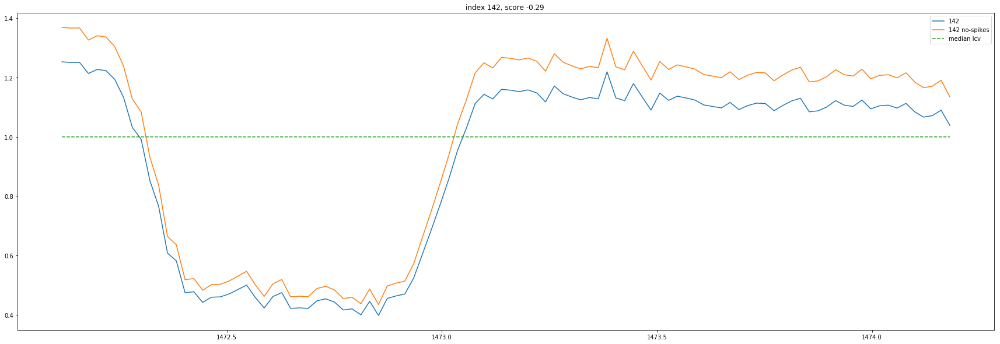

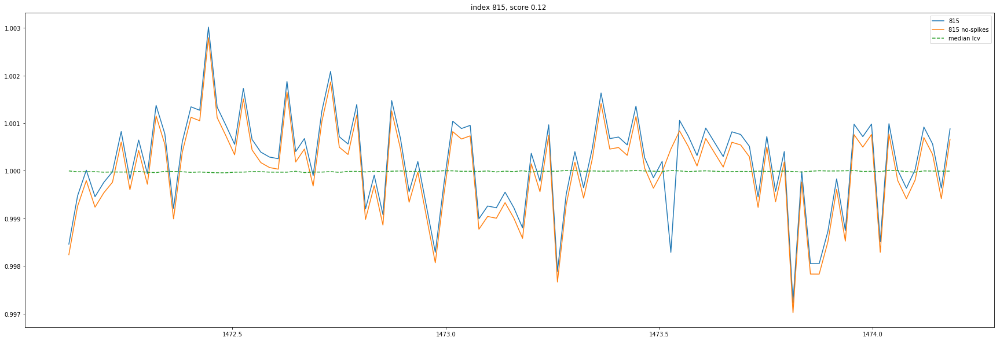

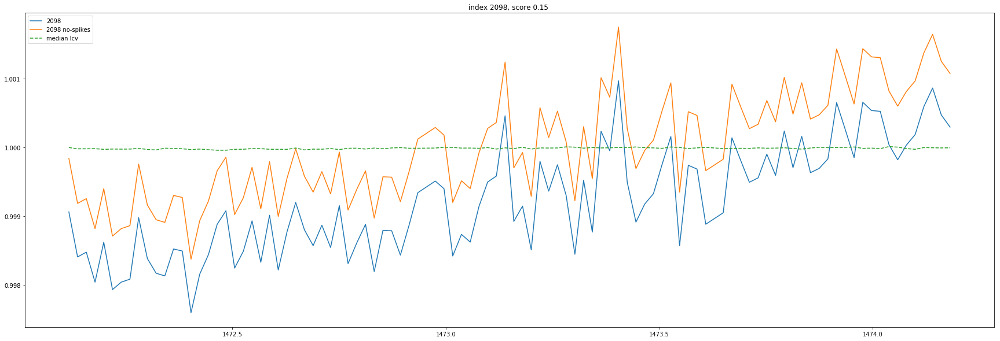

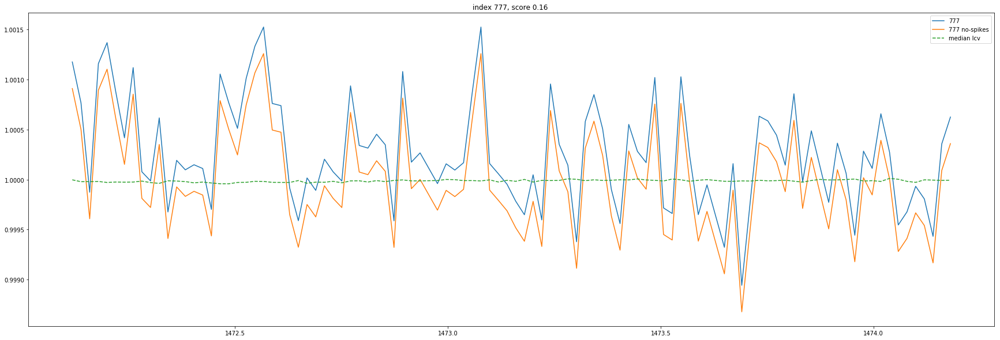

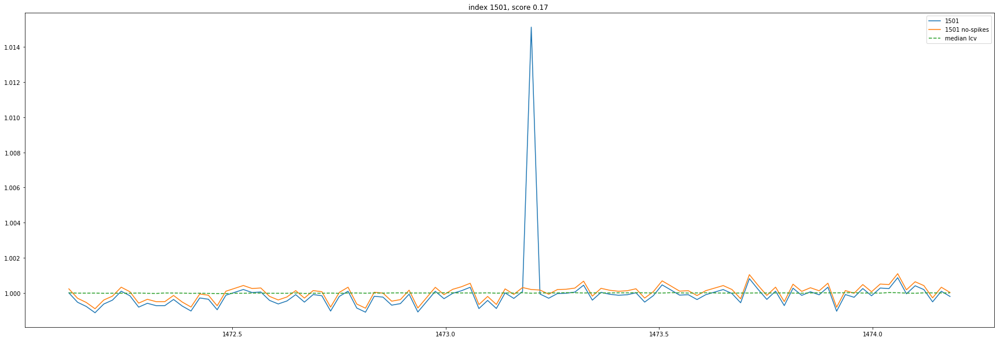

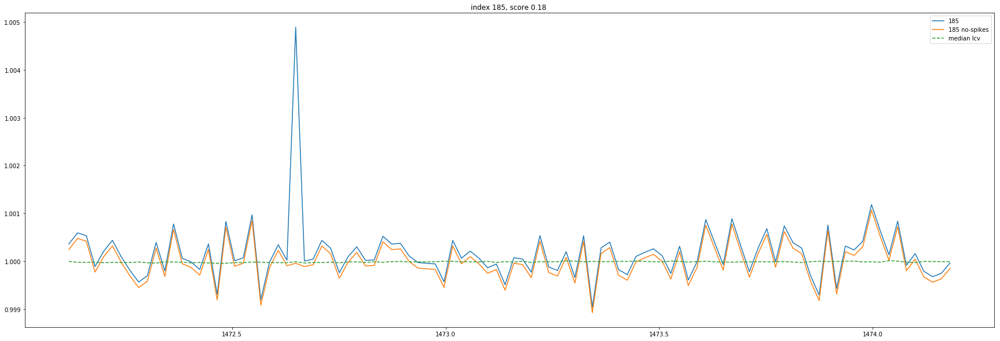

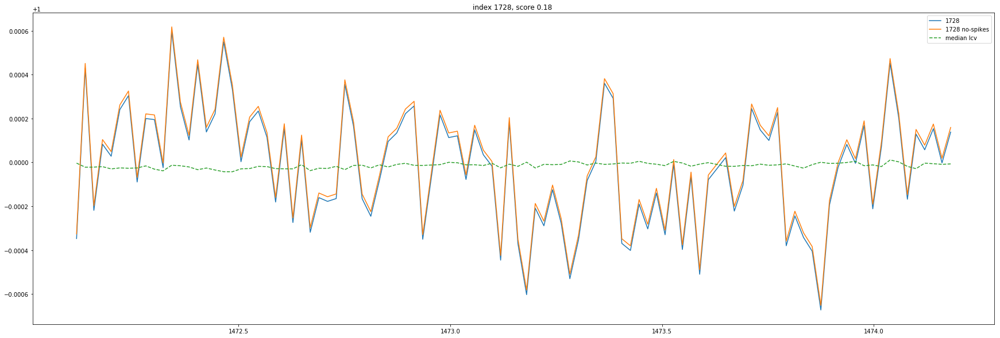

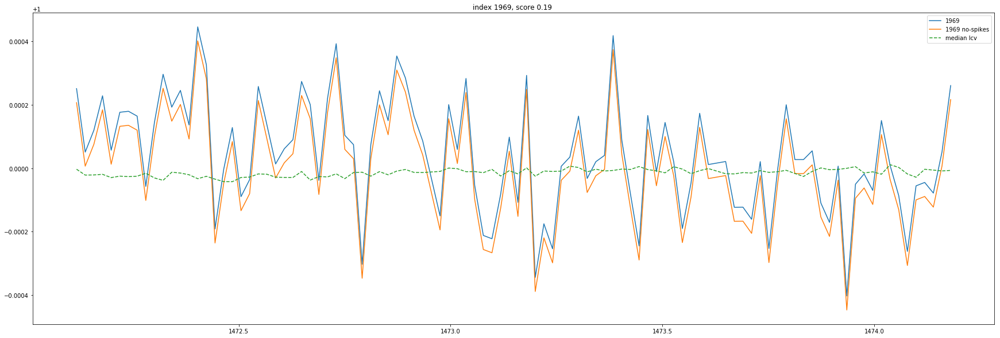

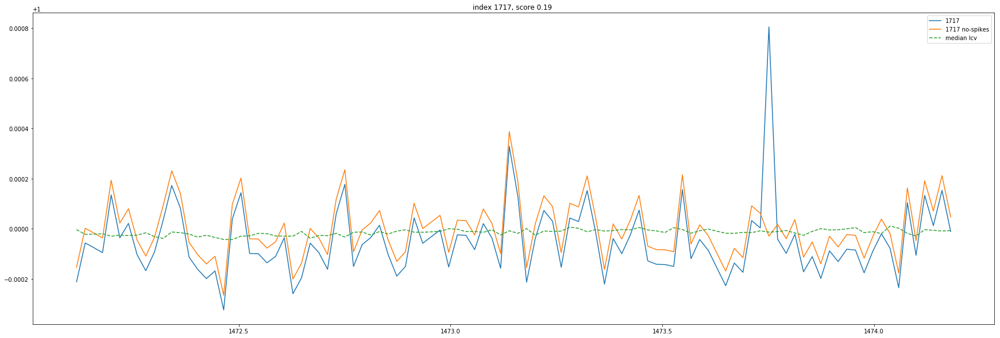

In [27]:
for i in np.argsort(scores_pred_fixed)[::300]:
    pl.figure(figsize=(30,10))
    pl.plot(lcvsKep[i,0], lcvsKep[i,1], '-', label="%i"%i)
    pl.plot(lcvsKepfixed[i,0], lcvsKepfixed[i,1], '-', label="%i no-spikes"%i)
    pl.plot(lcvsKep[i,0], np.median(lcvsKep[:,1], axis=0), '--', label="median lcv")
    pl.title("index %d, score %.2f "%(i, scores_pred_fixed[i]))
    
    pl.legend()

print ("printing Normalized sample one every 300 lcvs in decreasing weirdness order")

In [28]:
with open("outputs/denseKeplerIF.csv","w") as outf:
    outf.write("index,score\n")
    for j,i in  enumerate(np.argsort(scores_pred_LP)[:25]):
        print("{},{:.4f}".format(i, scores_pred_LP[i]))
        outf.write("{},{:.4f}\n".format(i, scores_pred_LP[i]))
    


142,-0.2864
55,-0.2769
696,-0.2758
1817,-0.2749
2091,-0.2491
206,-0.2473
12,-0.2424
360,-0.2384
326,-0.2320
2425,-0.2283
1973,-0.2262
1781,-0.2219
2000,-0.2196
2388,-0.2192
2382,-0.2188
2427,-0.2154
108,-0.2147
897,-0.2120
1384,-0.1959
1136,-0.1958
1133,-0.1947
2126,-0.1943
2234,-0.1939
2163,-0.1870
2396,-0.1864


the 25 weirdest lightcurves, normalized


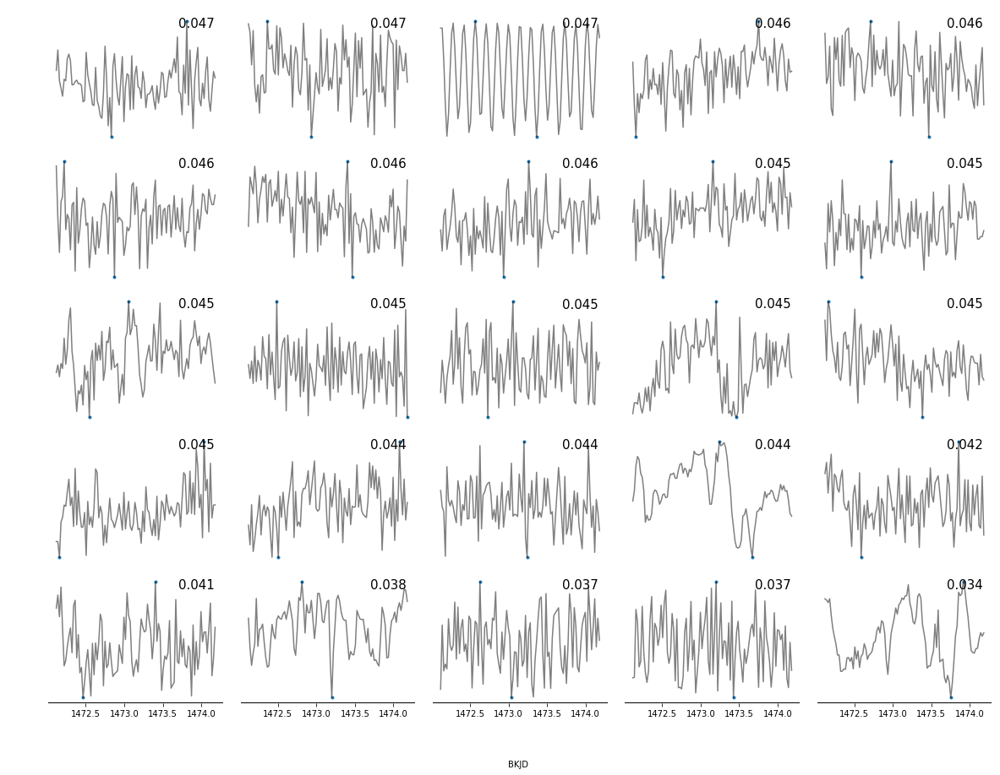

In [29]:
print ("the 25 weirdest lightcurves, normalized")

fig = pl.figure(figsize=(20,15))
pl.subplots_adjust(hspace=0.2)
pl.subplots_adjust(wspace=0.2)
for j,i in  enumerate(np.argsort(scores_pred_Norm)[:25][-1::-1]):
    ax = fig.add_subplot(5,5,j+1)
    minmax = [np.where(lcvsKep[i,1] == lcvsKep[i,1].min())[0][0], \
            np.where(lcvsKep[i,1] == lcvsKep[i,1].max())[0][0]]
    ax.plot(lcvsKep[i,0][minmax], lcvsKep[i,1][minmax], '.')
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], 'k-', alpha=0.5)
    xmin,xmax = ax.get_xlim()
    ymin,ymax = ax.get_ylim()
    if j < 20:
        ax.axis('off')
    else:
        ax.set_frame_on(False)
        ax.get_xaxis().tick_bottom()
        ax.axes.get_yaxis().set_visible(False)
        ax.add_artist(Line2D((xmin, xmax), (ymin, ymin), color='black', linewidth=2))
    pl.text(1473.7, ymin + (ymax-ymin) * 0.9, "%.3f"%scores_pred_Norm[i], fontsize=15)
    
    pl.xlim(xmin,xmax)
    pl.ylim(ymin,ymax)
    pl.subplots_adjust(hspace=0.1)
    pl.subplots_adjust(wspace=0.1)
    #ax.legend()

pl.text(1468, ymin - (ymax - ymin) * 0.5, "BKJD")
pl.savefig("ITweirdest.pdf")

the 25 least weird lightcurves, normalized


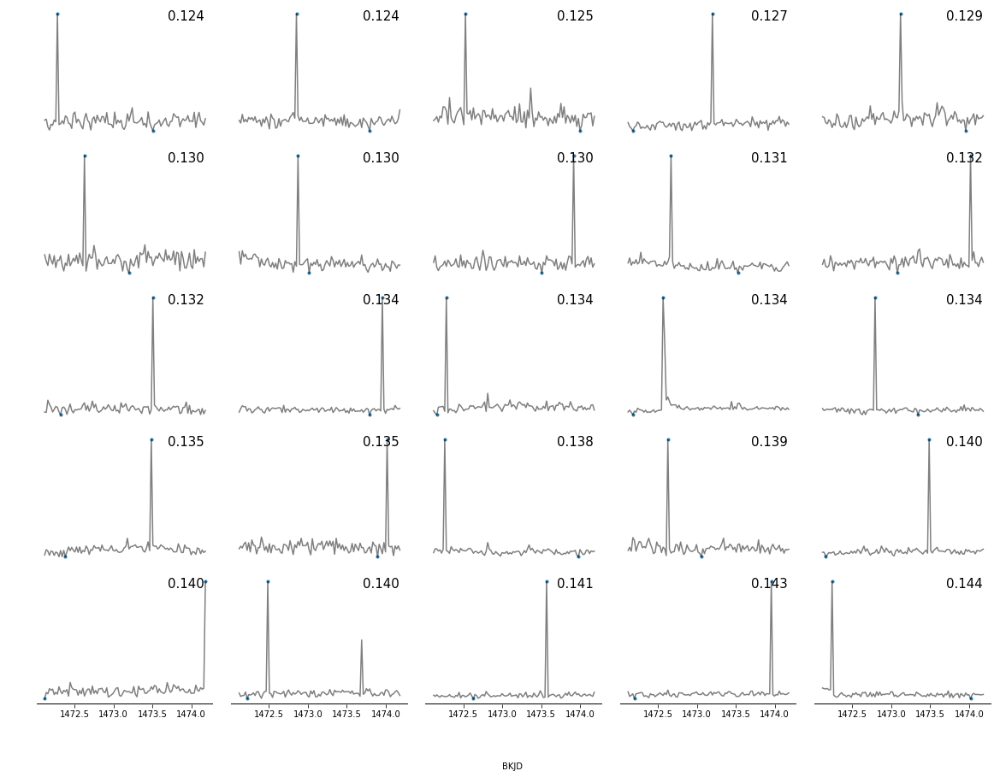

In [30]:
print ("the 25 least weird lightcurves, normalized")

fig = pl.figure(figsize=(20,15))
for j,i in  enumerate(np.argsort(scores_pred_Norm)[-25::1]):
    ax = fig.add_subplot(5,5,j+1)
    minmax = [np.where(lcvsKep[i,1] == lcvsKep[i,1].min())[0][0], \
            np.where(lcvsKep[i,1] == lcvsKep[i,1].max())[0][0]]
    ax.plot(lcvsKep[i,0][minmax], lcvsKep[i,1][minmax], '.')
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], 'k-', alpha=0.5)
    xmin,xmax = ax.get_xlim()
    ymin,ymax = ax.get_ylim()
    if j < 20:
        ax.axis('off')
    else:
        ax.set_frame_on(False)
        ax.get_xaxis().tick_bottom()
        ax.axes.get_yaxis().set_visible(False)
        ax.add_artist(Line2D((xmin, xmax), (ymin, ymin), color='black', linewidth=2))
    pl.text(1473.7, ymin + (ymax-ymin) * 0.9, "%.3f"%scores_pred_Norm[i], fontsize=15)
    
    pl.xlim(xmin,xmax)
    pl.ylim(ymin,ymax)
    pl.subplots_adjust(hspace=0.1)
    pl.subplots_adjust(wspace=0.1)
    #ax.legend()
pl.text(1468, ymin - (ymax - ymin) * 0.5, "BKJD")
pl.savefig("ITleastweird.pdf")

the least weird lightcurves are the one with spikes: the suppression of the signal due to normalization in the presence of spikes removes features that may contribute to weirdnes. basically the lightcurve is a flat baseline with one high point

the 25 weirdest low pass filtered lightcurves


Text(1468, -0.11591501235961915, 'BKJD')

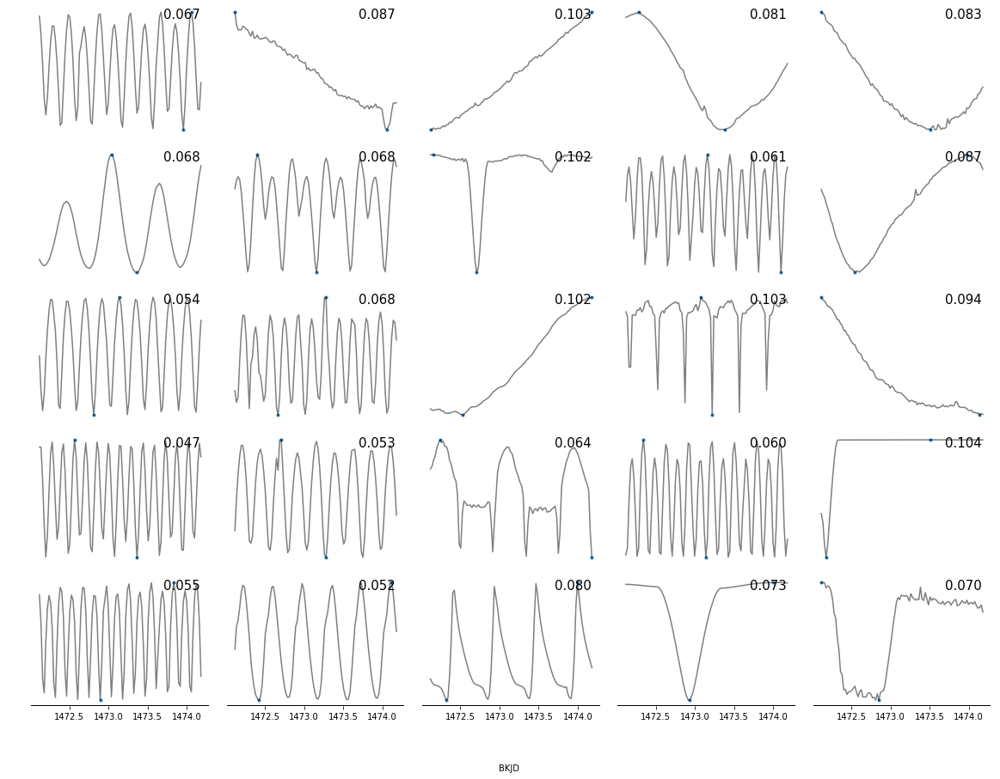

In [31]:
print ("the 25 weirdest low pass filtered lightcurves")

fig = pl.figure(figsize=(20,15))
for j,i in  enumerate(np.argsort(scores_pred_LP)[:25][::-1]):
    ax = fig.add_subplot(5,5,j+1)
    minmax = [np.where(lcvsKep[i,1] == lcvsKep[i,1].min())[0][0], \
            np.where(lcvsKep[i,1] == lcvsKep[i,1].max())[0][0]]
    ax.plot(lcvsKep[i,0][minmax], lcvsKep[i,1][minmax], '.')
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], 'k-', alpha=0.5)
    xmin,xmax = ax.get_xlim()
    ymin,ymax = ax.get_ylim()
    if j < 20:
        ax.axis('off')
    else:
        ax.set_frame_on(False)
        ax.get_xaxis().tick_bottom()
        ax.axes.get_yaxis().set_visible(False)
        ax.add_artist(Line2D((xmin, xmax), (ymin, ymin), color='black', linewidth=2))
    pl.text(1473.7, ymin + (ymax-ymin) * 0.9, "%.3f"%scores_pred_Norm[i], fontsize=15)
    
    pl.xlim(xmin,xmax)
    pl.ylim(ymin,ymax)
    pl.subplots_adjust(hspace=0.1)
    pl.subplots_adjust(wspace=0.1)
    #ax.legend()
pl.text(1468, ymin - (ymax - ymin) * 0.5, "BKJD")


the 25 weirdest lightcurves, no spikes


Text(1468, 0.9198559999465943, 'BKJD')

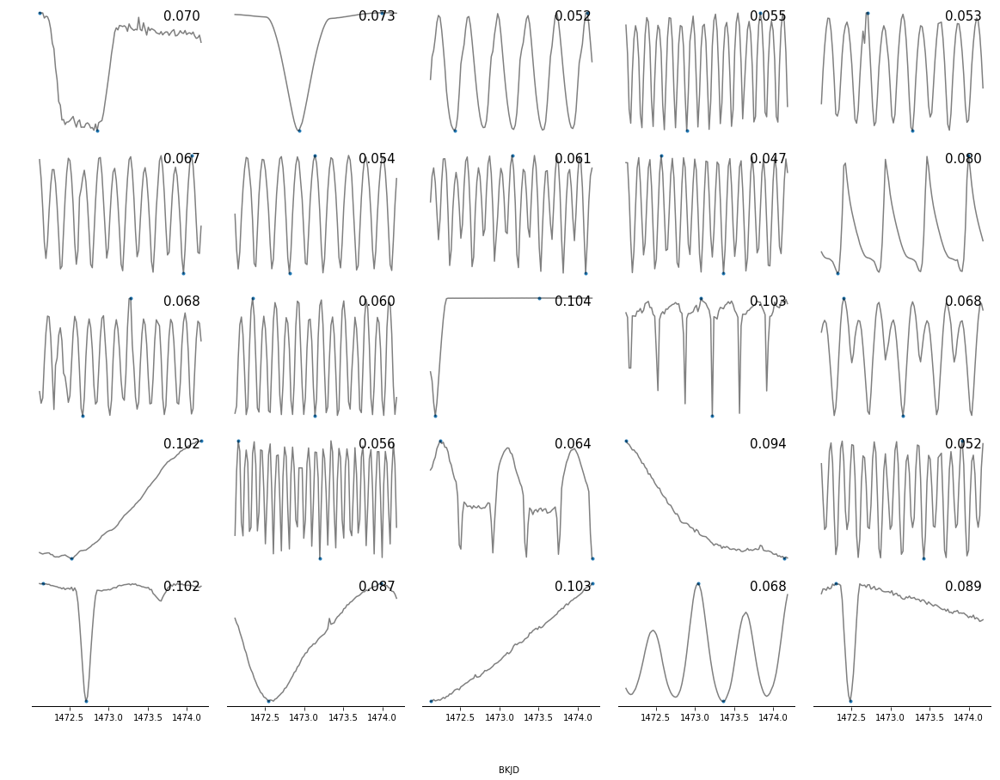

In [32]:
print ("the 25 weirdest lightcurves, no spikes")

fig = pl.figure(figsize=(20,15))
for j,i in  enumerate(np.argsort(scores_pred_fixed)[:25]):
    ax = fig.add_subplot(5,5,j+1)
    minmax = [np.where(lcvsKep[i,1] == lcvsKep[i,1].min())[0][0], \
            np.where(lcvsKep[i,1] == lcvsKep[i,1].max())[0][0]]
    ax.plot(lcvsKep[i,0][minmax], lcvsKep[i,1][minmax], '.')
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], 'k-', alpha=0.5)
    xmin,xmax = ax.get_xlim()
    ymin,ymax = ax.get_ylim()
    if j < 20:
        ax.axis('off')
    else:
        ax.set_frame_on(False)
        ax.get_xaxis().tick_bottom()
        ax.axes.get_yaxis().set_visible(False)
        ax.add_artist(Line2D((xmin, xmax), (ymin, ymin), color='black', linewidth=2))
    pl.text(1473.7, ymin + (ymax-ymin) * 0.9, "%.3f"%scores_pred_Norm[i], fontsize=15)
    
    pl.xlim(xmin,xmax)
    pl.ylim(ymin,ymax)
    pl.subplots_adjust(hspace=0.1)
    pl.subplots_adjust(wspace=0.1)
    #ax.legend()
pl.text(1468, ymin - (ymax - ymin) * 0.5, "BKJD")


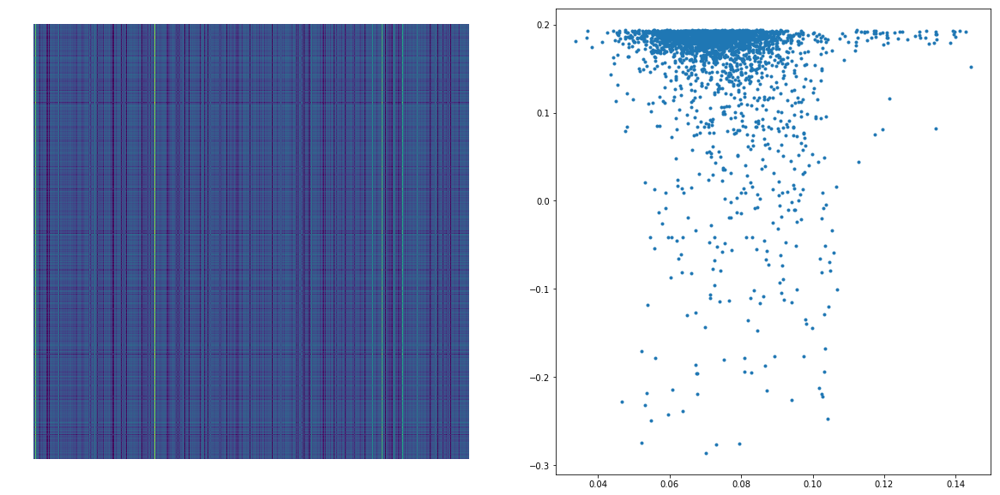

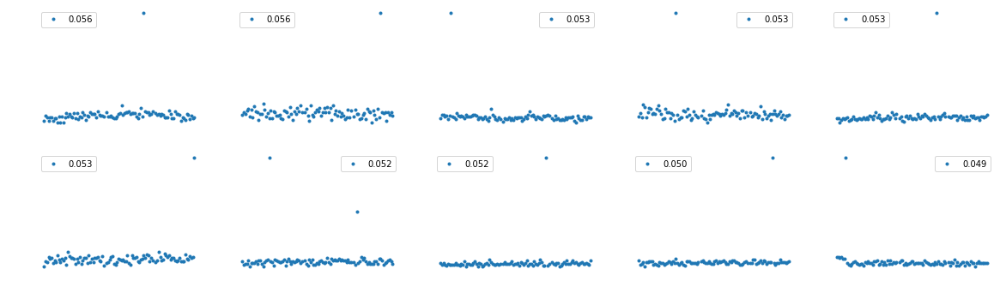

In [33]:
lpnormed = pairwise_distances(np.atleast_2d(scores_pred_Norm).T, 
                              np.atleast_2d(scores_pred_LP).T)

fig = pl.figure(figsize=(20,10))
ax = fig.add_subplot(121)
pl.imshow(lpnormed)
pl.axis('off')
ax = fig.add_subplot(122)
lpnormed.min(), lpnormed.max()
pl.plot(scores_pred_Norm, scores_pred_LP, '.')
lpnormed.min(), lpnormed.max()
pl.savefig("ITsimilarity1.pdf")

weirdest10 = np.argsort(lpnormed.mean(axis=1))[:10][::-1]
fig = pl.figure(figsize=(20,15))
for j,i in  enumerate(weirdest10):
    ax = fig.add_subplot(5,5,j+1)
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '.', label="%.3f"%lpnormed.mean(axis=1)[i])
    ax.legend()
    ax.axis('off')



outlier in only one set : 40, fraction: 0.002


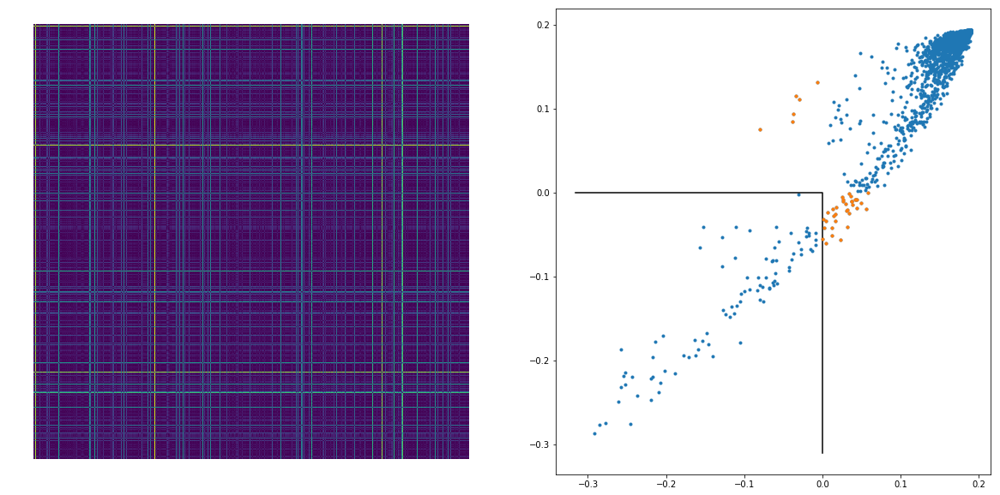

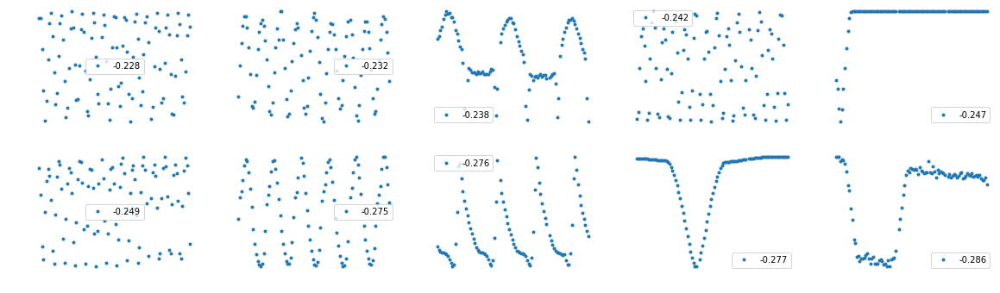

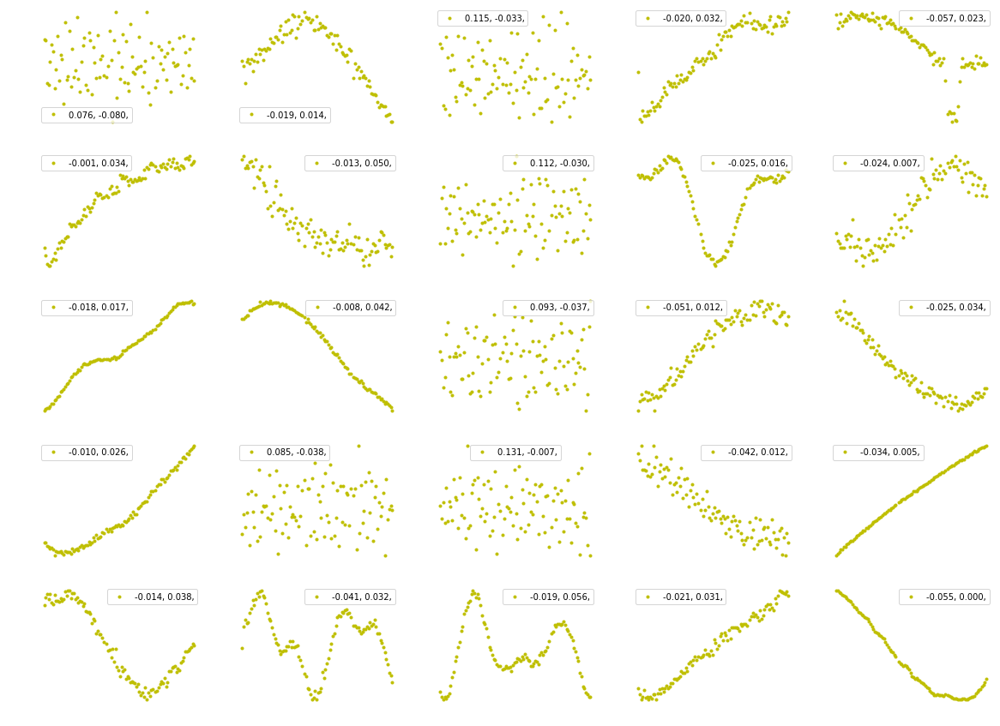

In [34]:
lpfixed = pairwise_distances(np.atleast_2d(scores_pred_fixed).T, 
                              np.atleast_2d(scores_pred_LP).T)

fig = pl.figure(figsize=(20,10))
ax = fig.add_subplot(121)
pl.imshow(lpfixed)
pl.axis('off')
lpfixed.min(), lpfixed.max()
ax = fig.add_subplot(122)
pl.plot(scores_pred_fixed, scores_pred_LP, '.')
pl.plot([ax.get_xlim()[0], 0, 0], 
        [0, 0, ax.get_ylim()[0]], 'k-')
pl.plot(scores_pred_fixed[((scores_pred_LP>0) + (scores_pred_fixed>0)) * 
                          ~((scores_pred_LP>0) * (scores_pred_fixed>0))], 
        scores_pred_LP[((scores_pred_LP>0) + (scores_pred_fixed>0)) * 
                        ~((scores_pred_LP>0) * (scores_pred_fixed>0))], '.')
print ("outlier in only one set : {:d}, fraction: {:.3f}".format(
    sum(((scores_pred_LP>0) + (scores_pred_fixed>0)) * 
                          ~((scores_pred_LP>0) * (scores_pred_fixed>0))),
    sum(((scores_pred_LP>0) + (scores_pred_fixed>0)) * 
                          ~((scores_pred_LP>0) * (scores_pred_fixed>0))) * 
    0.1 / len(scores_pred_LP)))
pl.savefig("ITsimilarity1.pdf")

weirdest10 = np.argsort(scores_pred_LP)[:10][::-1]
fig = pl.figure(figsize=(20,15))
for j,i in  enumerate(weirdest10):
    ax = fig.add_subplot(5,5,j+1)
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '.', label="%.3f"%scores_pred_LP[i])
    ax.legend()
    ax.axis('off')

    
    
fig = pl.figure(figsize=(20,15))
ambiguous = np.arange(len(lpfixed)).astype(int)[((scores_pred_LP>0) + (scores_pred_fixed>0)) * 
                          ~((scores_pred_LP>0) * (scores_pred_fixed>0))]
for j,i in  enumerate(ambiguous[:25]):
    ax = fig.add_subplot(5,5,j+1)
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], 'y.', 
            label="%.3f, %.3f,"%(scores_pred_LP[i], scores_pred_fixed[i]))
    ax.legend()
    ax.axis('off')


 no correlation in the normalized and LP filtered scores
 
 strong correlation in the normalized vs fixed filtered scores
 

In [35]:
import astroML as aml

In [36]:
aml
from astroML import plotting

In [37]:
pl.rcParams['image.cmap'] = 'bone'

In [38]:
aml.plotting.scatter_contour?

In [39]:
pylab.contourf?

In [88]:
print("Perarsons test: correlation r between scores of normalized and fixed-by-replacements {0:.2f},  p-value {1:.2g}".format(
    *stats.pearsonr(scores_pred_Norm, 
               scores_pred_fixed)))
print("Perarsons test: correlation r between scores of normalized and LP filtered {0:.2f},  p-value {1:.2g}".format(
    *stats.pearsonr(scores_pred_Norm, 
              scores_pred_LP)))
print("Perarsons test: correlation r between scores of fixed-by-replacements and LP filtered {0:.2f},  p-value {1:.2g}".format(
    *stats.pearsonr(scores_pred_fixed, 
               scores_pred_LP)))

Perarsons test: correlation r between scores of normalized and fixed-by-replacements -0.10,  p-value 1.6e-06
Perarsons test: correlation r between scores of normalized and LP filtered -0.16,  p-value 3.3e-15
Perarsons test: correlation r between scores of fixed-by-replacements and LP filtered 0.96,  p-value 0


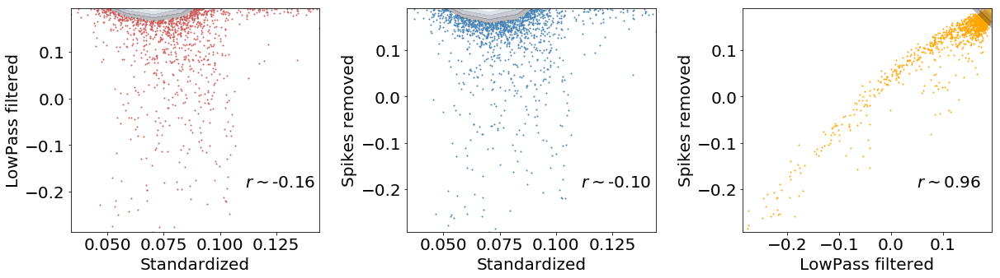

In [100]:
fig = pl.figure(figsize=(20,5))


pl.subplots_adjust(wspace=0.35)

ax = fig.add_subplot(131)
#pl.plot(scores_pred_Norm, scores_pred_LP, 'k.', alpha=0.3)
aml.plotting.scatter_contour(scores_pred_Norm, scores_pred_LP, log_counts=True,
                                 levels=5, threshold=200,
                            plot_args = {'ms':2, 'color':'IndianRed'},
                            contour_args = {"alpha":0.3})
pl.text((pl.xlim()[1] - pl.xlim()[0]) * 0.7 + pl.xlim()[0], 
        (pl.ylim()[1] - pl.ylim()[0]) * 0.2 + pl.ylim()[0], 
    r"$r\sim${:.2f}".format(
    stats.pearsonr(scores_pred_Norm, scores_pred_LP)[0]))
pl.xlabel("Standardized")
pl.ylabel("LowPass filtered")

ax = fig.add_subplot(132)
#pl.plot(scores_pred_Norm, scores_pred_fixed, '.', color='DarkOrange', alpha=0.3)
aml.plotting.scatter_contour(scores_pred_Norm, scores_pred_fixed, log_counts=True,
                                 levels=5, threshold=200, 
                             plot_args={'ms':2, 'color':'SteelBlue'},
                            contour_args = {"alpha":0.3})
pl.text((pl.xlim()[1] - pl.xlim()[0]) * 0.7 + pl.xlim()[0], 
    (pl.ylim()[1] - pl.ylim()[0]) * 0.2 + pl.ylim()[0], 
    r"$r\sim${:.2f}".format(
    stats.pearsonr(scores_pred_Norm, scores_pred_fixed)[0]))
pl.xlabel("Standardized")
pl.ylabel("Spikes removed")


ax = fig.add_subplot(133)
#pl.plot(scores_pred_LP, scores_pred_fixed, '.', color='DarkGreen', alpha=0.3)
aml.plotting.scatter_contour(scores_pred_LP, scores_pred_fixed, log_counts=True,
                                 levels=5, threshold=200, 
                             plot_args={'ms':2, 'color':'Orange'},
                            contour_args = {"alpha":0.3})
pl.text((pl.xlim()[1] - pl.xlim()[0]) * 0.7 + pl.xlim()[0], 
        (pl.ylim()[1] - pl.ylim()[0]) * 0.2 + pl.ylim()[0], 
        r"$r\sim${:.2f}".format(
            stats.pearsonr(scores_pred_LP, scores_pred_fixed)[0]))
pl.xlabel("LowPass filtered")
pl.ylabel("Spikes removed")
pl.savefig("figures/IFanomalyscores.png")



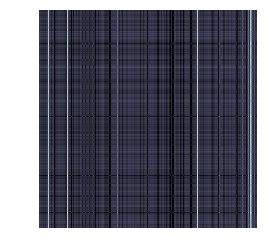

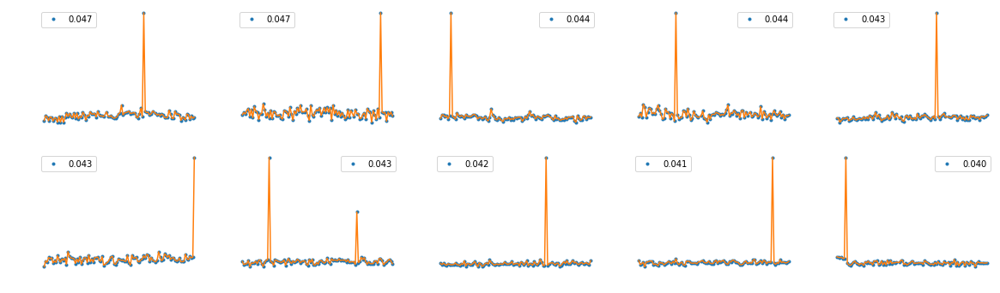

In [42]:
nospikesnormed = pairwise_distances(np.atleast_2d(scores_pred_Norm).T, 
                                     np.atleast_2d(scores_pred_fixed).T)
pl.imshow(nospikesnormed)
pl.axis('off')
pl.savefig("ITsimilarity2.pdf")
weirdest10 = np.argsort(nospikesnormed.mean(axis=1))[:10][::-1]
fig = pl.figure(figsize=(20,15))
for j,i in  enumerate(weirdest10):
    ax = fig.add_subplot(5,5,j+1)
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '.', label="%.3f"%nospikesnormed.mean(axis=1)[i])
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '-')
    ax.legend()
    ax.axis('off')



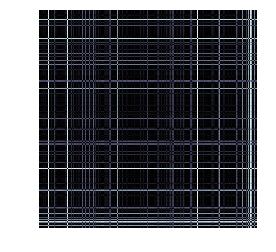

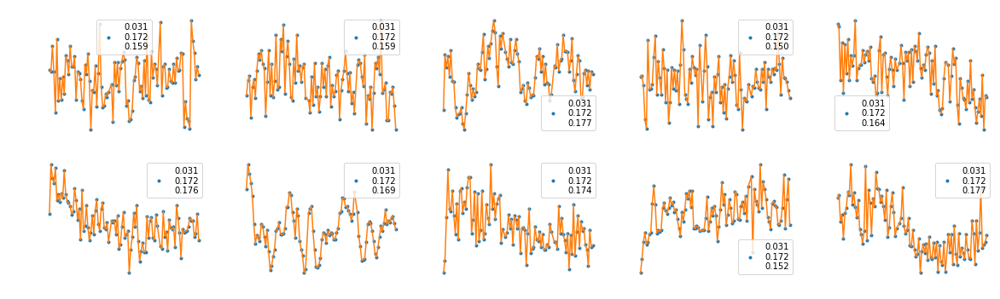

In [43]:
nospikeslp = pairwise_distances(np.atleast_2d(scores_pred_LP).T, 
                                     np.atleast_2d(scores_pred_fixed).T)
pl.imshow(nospikeslp)
pl.axis('off')
pl.savefig("ITsimilarity3.pdf")
weirdest10 = np.argsort(nospikeslp.mean(axis=1))[:10][::-1]
fig = pl.figure(figsize=(20,15))
for j,i in  enumerate(weirdest10):
    ax = fig.add_subplot(5,5,j+1)
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '.', label="%.3f\n%.3f\n%.3f"%(
            nospikeslp.mean(axis=1)[i], scores_pred_LP[i], scores_pred_fixed[i]))
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '-')    
    ax.legend()
    ax.axis('off')

    

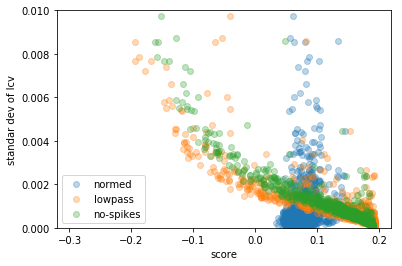

In [44]:
ax = pl.figure().add_subplot(111)
pl.xlabel("score")
pl.ylabel("standar dev of lcv")
pl.scatter(scores_pred_Norm, (lcvsKep[:,:][:,1]).std(axis=1), alpha=0.3, label="normed")
pl.scatter(scores_pred_LP, (lcvsKep[:,:][:,1]).std(axis=1), alpha=0.3,
          label="lowpass")
pl.scatter(scores_pred_fixed, (lcvsKep[:,:][:,1]).std(axis=1), alpha=0.3,
          label="no-spikes")
#ax.set_yscale("log")
ax.set_ylim(0,0.01)
ax.legend()
pl.savefig("scoreVSsnrFedIsolation.png")

In [45]:
stats.pearsonr(scores_pred_Norm, 
           (lcvsKep[:,:][:,1]).std(axis=1)), stats.pearsonr(scores_pred_fixed, 
           (lcvsKep[:,:][:,1]).std(axis=1)), stats.pearsonr(scores_pred_LP, 
           (lcvsKep[:,:][:,1]).std(axis=1))

((-0.007727868373055974, 0.6993441520637959),
 (-0.5364442994173785, 2.4772018314916634e-186),
 (-0.49070506294604704, 1.2098440465076094e-151))

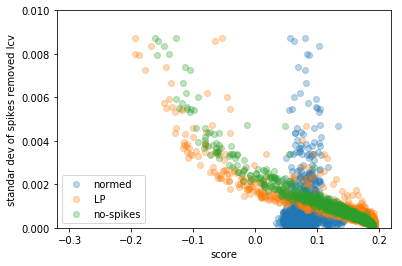

In [46]:
ax = pl.figure().add_subplot(111)
pl.xlabel("score")
pl.ylabel("standar dev of spikes removed lcv")

pl.scatter(scores_pred_Norm, (lcvsKepfixed[:,:][:,1]).std(axis=1), alpha=0.3,
          label="normed")
pl.scatter(scores_pred_LP, (lcvsKepfixed[:,:][:,1]).std(axis=1), alpha=0.3, label="LP")
pl.scatter(scores_pred_fixed, (lcvsKepfixed[:,:][:,1]).std(axis=1), alpha=0.3,
          label="no-spikes")
#ax.set_yscale("log")
ax.set_ylim(0,0.01)
ax.legend()
pl.savefig("scoreVSsnrNoSpikesFedIsolation.png")

In [47]:
stats.pearsonr(scores_pred_Norm, 
           (lcvsKepfixed[:,:][:,1]).std(axis=1)), stats.pearsonr(scores_pred_fixed, 
           (lcvsKepfixed[:,:][:,1]).std(axis=1)), stats.pearsonr(scores_pred_LP, 
           (lcvsKepfixed[:,:][:,1]).std(axis=1))

((-0.019456062932464137, 0.3308472804847402),
 (-0.5277066235566119, 2.73386928092123e-179),
 (-0.48220958036870476, 9.199470223664115e-146))

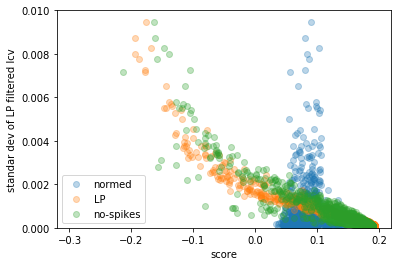

In [48]:
ax = pl.figure().add_subplot(111)
pl.xlabel("score")
pl.ylabel("standar dev of LP filtered lcv")

pl.scatter(scores_pred_Norm, (lcvsKepLP[:,:][:,1]).std(axis=1), alpha=0.3,
          label="normed")
pl.scatter(scores_pred_LP, (lcvsKepLP[:,:][:,1]).std(axis=1), alpha=0.3, label="LP")
pl.scatter(scores_pred_fixed, (lcvsKepLP[:,:][:,1]).std(axis=1), alpha=0.3,
          label="no-spikes")
#ax.set_yscale("log")
ax.set_ylim(0,0.01)
ax.legend()
pl.savefig("scoreVSsnrLPFedIsolation.pdf")

In [49]:
stats.pearsonr(scores_pred_Norm, 
           (lcvsKepLP[:,:][:,1]).std(axis=1)), stats.pearsonr(scores_pred_fixed, 
           (lcvsKepLP[:,:][:,1]).std(axis=1)), stats.pearsonr(scores_pred_LP, 
           (lcvsKepLP[:,:][:,1]).std(axis=1))

((0.008045175477749748, 0.6876368492274654),
 (-0.44157977585979935, 7.968040471859286e-120),
 (-0.41670513900916606, 1.3329240747254735e-105))

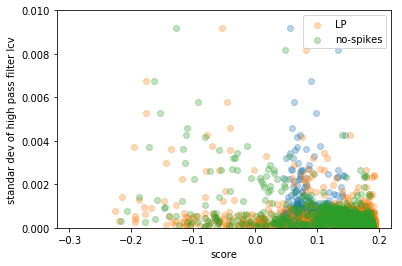

In [50]:
ax = pl.figure().add_subplot(111)
pl.xlabel("score")
pl.ylabel("standar dev of high pass filter lcv")

pl.scatter(scores_pred_Norm, ((lcvsKep - M)[:,:][:,1]).std(axis=1), alpha=0.3)
pl.scatter(scores_pred_LP, ((lcvsKep - M)[:,:][:,1]).std(axis=1), alpha=0.3, label="LP")
pl.scatter(scores_pred_fixed, ((lcvsKep - M)[:,:][:,1]).std(axis=1), alpha=0.3,
          label="no-spikes")
#ax.set_yscale("log")
ax.set_ylim(0,0.01)
ax.legend()
pl.savefig("scoreVSsnHPrFedIsolation.png")

No handles with labels found to put in legend.


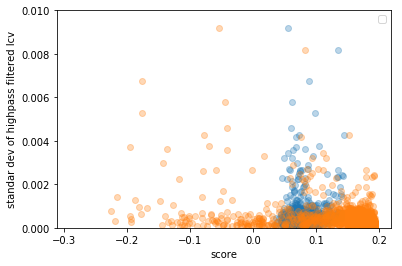

In [51]:
ax = pl.figure().add_subplot(111)
pl.xlabel("score")
pl.ylabel("standar dev of highpass filtered lcv")
pl.scatter(scores_pred_Norm, (lcvsKep[:,:,notnan][:,1] - M[:,1]).std(axis=1), alpha=0.3)
pl.scatter(scores_pred_LP, (lcvsKep[:,:,notnan][:,1] - M[:,1]).std(axis=1), alpha=0.3)
#ax.set_yscale("log")
ax.legend()
ax.set_ylim(0,0.01)
pl.savefig("scoreVSsnrFedIsolation.png")

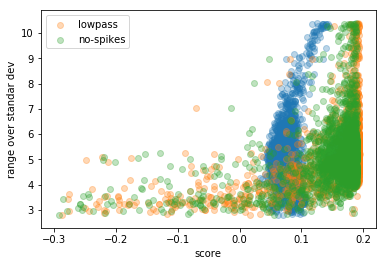

In [52]:
ax = pl.figure().add_subplot(111)
pl.xlabel("score")
pl.ylabel("range over standar dev")
pl.scatter(scores_pred_Norm, (lcvsKep[:,:][:,1].max(axis=1) - 
                              lcvsKep[:,:][:,1].min(axis=1)) / 
           (lcvsKep[:,:][:,1]).std(axis=1), alpha=0.3)
pl.scatter(scores_pred_LP, (lcvsKep[:,:][:,1].max(axis=1) - 
                              lcvsKep[:,:][:,1].min(axis=1)) / 
           (lcvsKep[:,:][:,1]).std(axis=1), alpha=0.3,
          label="lowpass")
pl.scatter(scores_pred_fixed, (lcvsKep[:,:][:,1].max(axis=1) - 
                              lcvsKep[:,:][:,1].min(axis=1)) / 
           (lcvsKep[:,:][:,1]).std(axis=1), alpha=0.3,
          label="no-spikes")
#ax.set_yscale("log")
#ax.set_ylim(0,0.01)
ax.legend()
pl.savefig("scoreVSRangeOnsnrFedIsolation.pdf")

In [53]:
stats.pearsonr(scores_pred_Norm, (lcvsKep[:,:][:,1].max(axis=1) - 
                              lcvsKep[:,:][:,1].min(axis=1)) / 
           (lcvsKep[:,:][:,1]).std(axis=1)),\
stats.pearsonr(scores_pred_fixed, (lcvsKep[:,:][:,1].max(axis=1) - 
                              lcvsKep[:,:][:,1].min(axis=1)) / 
           (lcvsKep[:,:][:,1]).std(axis=1)),\
stats.pearsonr(scores_pred_LP, (lcvsKep[:,:][:,1].max(axis=1) - 
                              lcvsKep[:,:][:,1].min(axis=1)) / 
           (lcvsKep[:,:][:,1]).std(axis=1))

((0.35940749723734483, 4.176464433565006e-77),
 (0.344574608607355, 1.2724438189206428e-70),
 (0.4171899446300477, 7.225433582436929e-106))

No handles with labels found to put in legend.


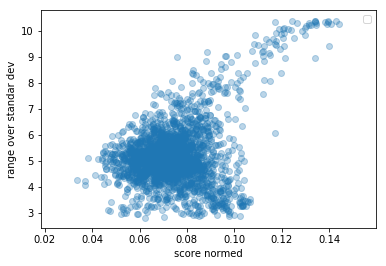

In [54]:
ax = pl.figure().add_subplot(111)
pl.xlabel("score normed")
pl.ylabel("range over standar dev")
pl.scatter(scores_pred_Norm, (lcvsKep[:,:][:,1].max(axis=1) - 
                              lcvsKep[:,:][:,1].min(axis=1)) / 
           (lcvsKep[:,:][:,1]).std(axis=1), alpha=0.3)
#ax.set_yscale("log")
#ax.set_ylim(0,0.01)
ax.legend()
pl.savefig("scoreVSRangeFedIsolation1.pdf")

No handles with labels found to put in legend.


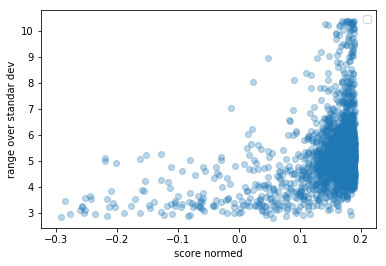

In [55]:
ax = pl.figure().add_subplot(111)
pl.xlabel("score normed")
pl.ylabel("range over standar dev")
pl.scatter(scores_pred_fixed, (lcvsKep[:,:][:,1].max(axis=1) - 
                              lcvsKep[:,:][:,1].min(axis=1)) / 
           (lcvsKep[:,:][:,1]).std(axis=1), alpha=0.3)
#ax.set_yscale("log")
#ax.set_ylim(0,0.01)
ax.legend()
pl.savefig("scoreVSRangeFedIsolation.pdf")

No handles with labels found to put in legend.
No handles with labels found to put in legend.


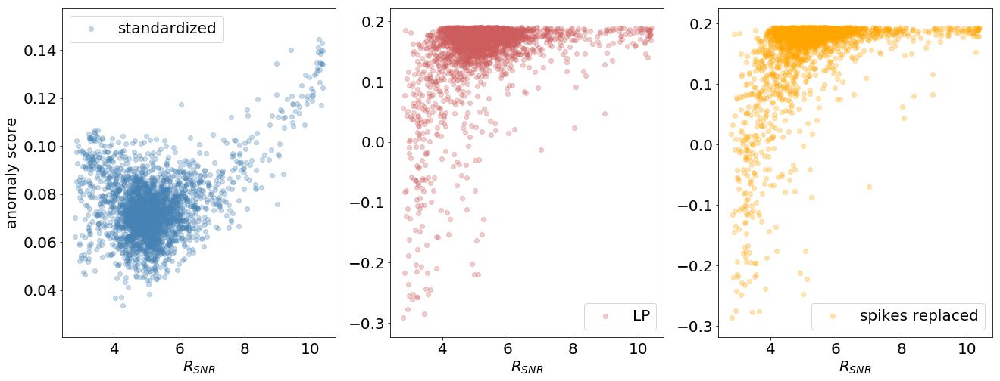

In [102]:
pl.rcParams["font.size"] = 20
fig = pl.figure(figsize=(22,8))
ax = fig.add_subplot(131)
pl.ylabel("anomaly score")
pl.xlabel(r"$R_{SNR}$")
pl.scatter((lcvsKep[:,:][:,1].max(axis=1) - 
                              lcvsKep[:,:][:,1].min(axis=1)) / 
           (lcvsKep[:,:][:,1]).std(axis=1), scores_pred_Norm, alpha=0.3,
          c="SteelBlue", label='standardized')
                                                                
ax.legend()

#ax.set_yscale("log")
#ax.set_ylim(0,0.01)
ax = fig.add_subplot(132)
ax.legend()
pl.ylabel("")
pl.xlabel(r"$R_{SNR}$")
pl.scatter((lcvsKep[:,:][:,1].max(axis=1) - 
                              lcvsKep[:,:][:,1].min(axis=1)) / 
           (lcvsKep[:,:][:,1]).std(axis=1), scores_pred_fixed, alpha=0.3,
          c="IndianRed", label='LP')
ax.legend()

#ax.set_ylim(0,0.01)
ax = fig.add_subplot(133)
ax.legend()
pl.ylabel("")
pl.xlabel(r"$R_{SNR}$")
pl.scatter((lcvsKep[:,:][:,1].max(axis=1) - 
                              lcvsKep[:,:][:,1].min(axis=1)) / 
           (lcvsKep[:,:][:,1]).std(axis=1), scores_pred_LP, alpha=0.3,
          c="Orange", label='spikes replaced')#ax.set_yscale("log")
#ax.set_yscale("log")
#ax.set_ylim(0,0.01)
ax.legend()
pl.savefig("figures/scoreVSRangeOnsnrFedIsolation.png")


In [57]:
stats.pearsonr(scores_pred_Norm, (lcvsKep[:,:][:,1].max(axis=1) - 
                              lcvsKep[:,:][:,1].min(axis=1)) / 
           (lcvsKep[:,:][:,1]).std(axis=1))

(0.35940749723734483, 4.176464433565006e-77)

No handles with labels found to put in legend.


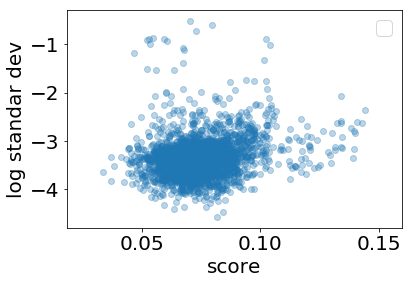

In [58]:
ax = pl.figure().add_subplot(111)
pl.xlabel("score")
pl.ylabel("log standar dev")
pl.scatter(scores_pred_Norm, np.log10(lcvsKep[:,:][:,1].std(axis=1)), alpha=0.3)
#ax.set_yscale("log")
#ax.set_ylim(0,0.01)
ax.legend()
pl.savefig("scoreVSRangeOnsnrFedIsolation.pdf")

In [59]:
stats.pearsonr(scores_pred_Norm, 
           (lcvsKep[:,:][:,1]).std(axis=1)), stats.pearsonr(scores_pred_Norm, (lcvsKep[:,:][:,1].max(axis=1) - 
                              lcvsKep[:,:][:,1].min(axis=1)))

((-0.007727868373055974, 0.6993441520637959),
 (0.02198163497641833, 0.27191429233634523))

No handles with labels found to put in legend.


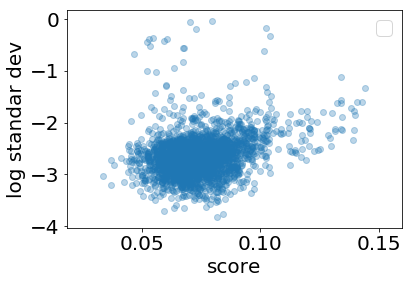

In [60]:
ax = pl.figure().add_subplot(111)
pl.xlabel("score")
pl.ylabel("log standar dev")
pl.scatter(scores_pred_Norm, np.log10(lcvsKep[:,:][:,1].max(axis=1) - 
                              lcvsKep[:,:][:,1].min(axis=1)), alpha=0.3)
#ax.set_yscale("log")
#ax.set_ylim(0,0.01)
ax.legend()
pl.savefig("scoreVSsnrFedIsolation.png")

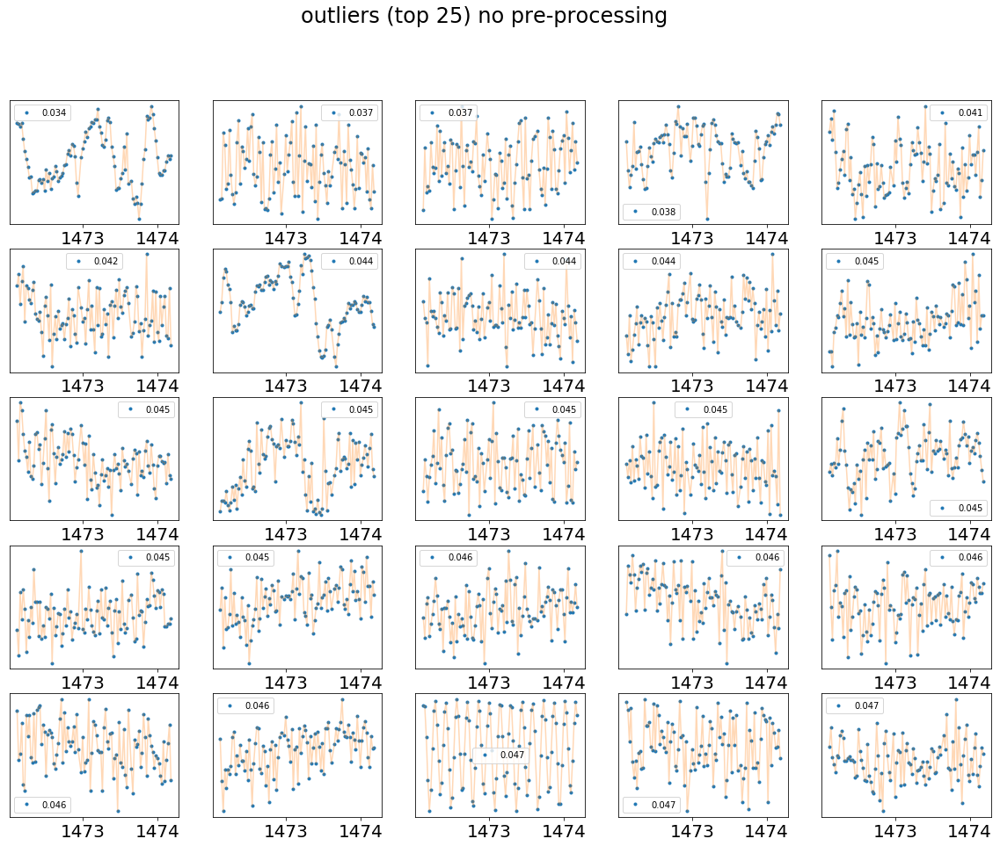

In [61]:
fig = pl.figure(figsize=(20,15))
for j,i in  enumerate(np.argsort(scores_pred_Norm)[:25]):
    ax=fig.add_subplot(5,5,j+1)
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '.', label="%.3f"%scores_pred_Norm[i])
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '-', alpha=0.3)
    ax.legend(fontsize=10)
    ax.set_yticks([])    
pl.suptitle("outliers (top 25) no pre-processing")
pl.savefig("outliers.png")

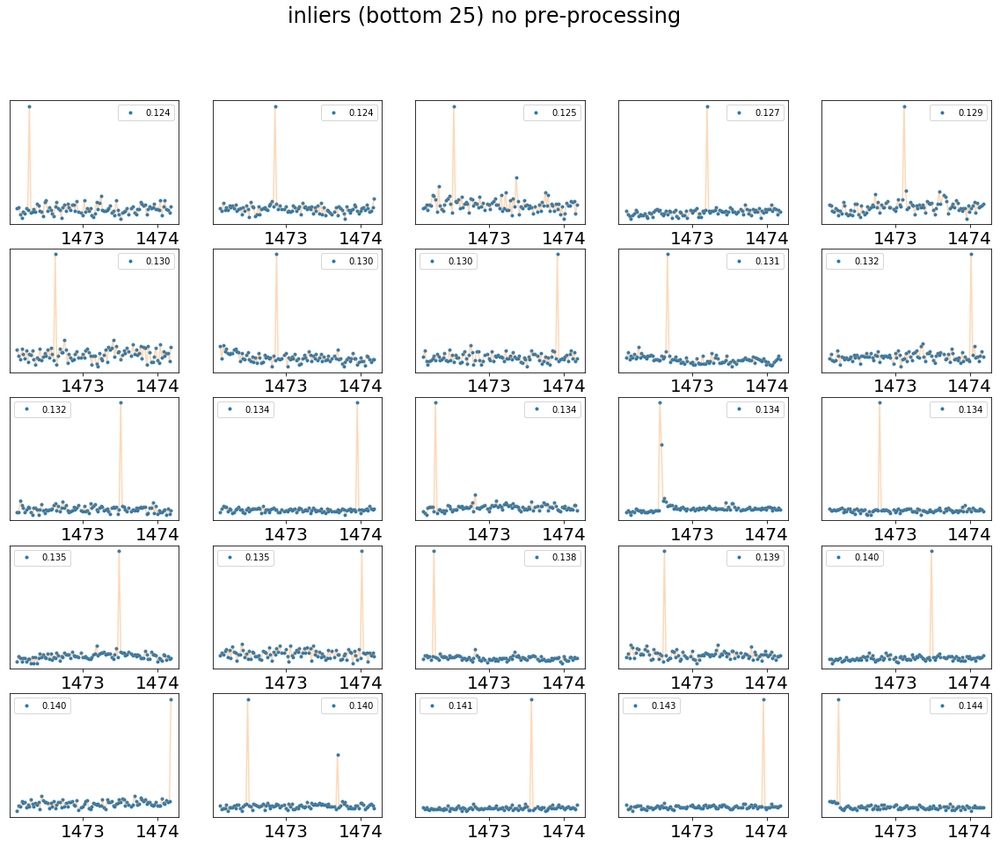

In [62]:
fig = pl.figure(figsize=(20,15))
for j,i in  enumerate(np.argsort(scores_pred_Norm)[-25:]):
    ax=fig.add_subplot(5,5,j+1)
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '.', label="%.3f"%scores_pred_Norm[i])
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '-', alpha=0.3)
    ax.legend(fontsize=10)
    ax.set_yticks([])
pl.suptitle("inliers (bottom 25) no pre-processing")

pl.savefig("inliersNorm.png")

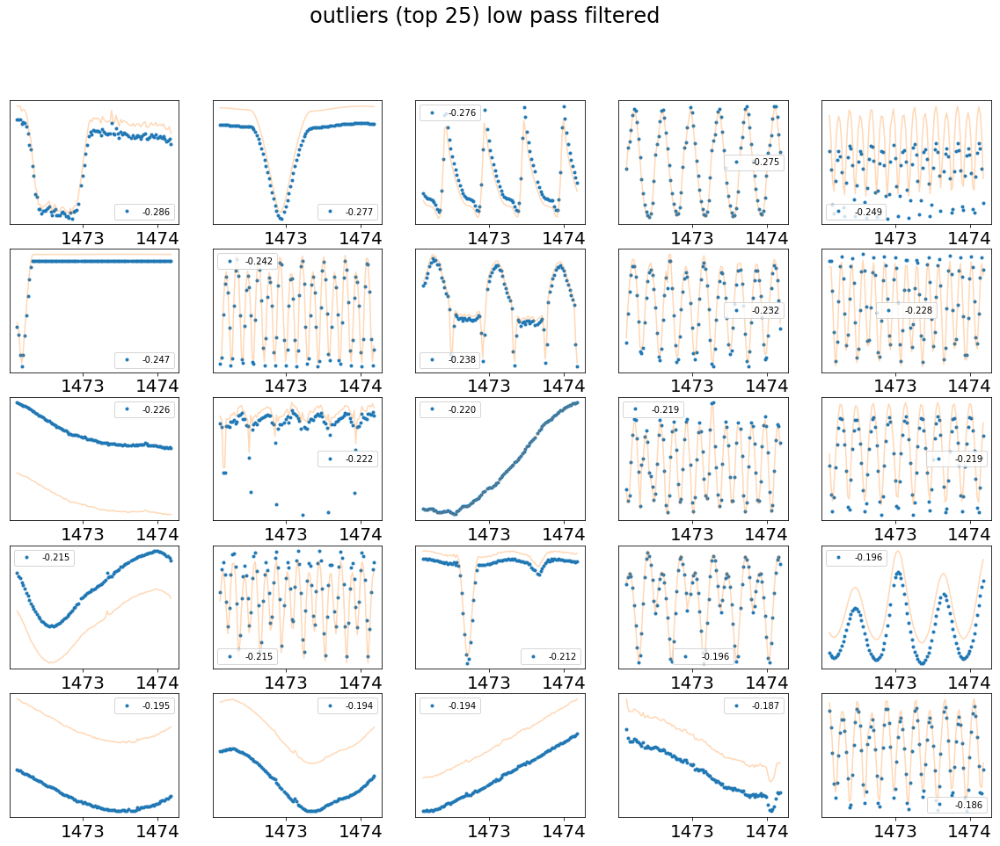

In [63]:
fig = pl.figure(figsize=(20,15))
for j,i in  enumerate(np.argsort(scores_pred_LP)[:25]):
    ax=fig.add_subplot(5,5,j+1)
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '.', label="%.3f"%scores_pred_LP[i])
    ax.plot(lcvsKepfixed[i,0], lcvsKepfixed[i,1], '-', alpha=0.3)
    ax.legend(fontsize=10)
    ax.set_yticks([])    
pl.suptitle("outliers (top 25) low pass filtered")
pl.savefig("outliersNorm.png")

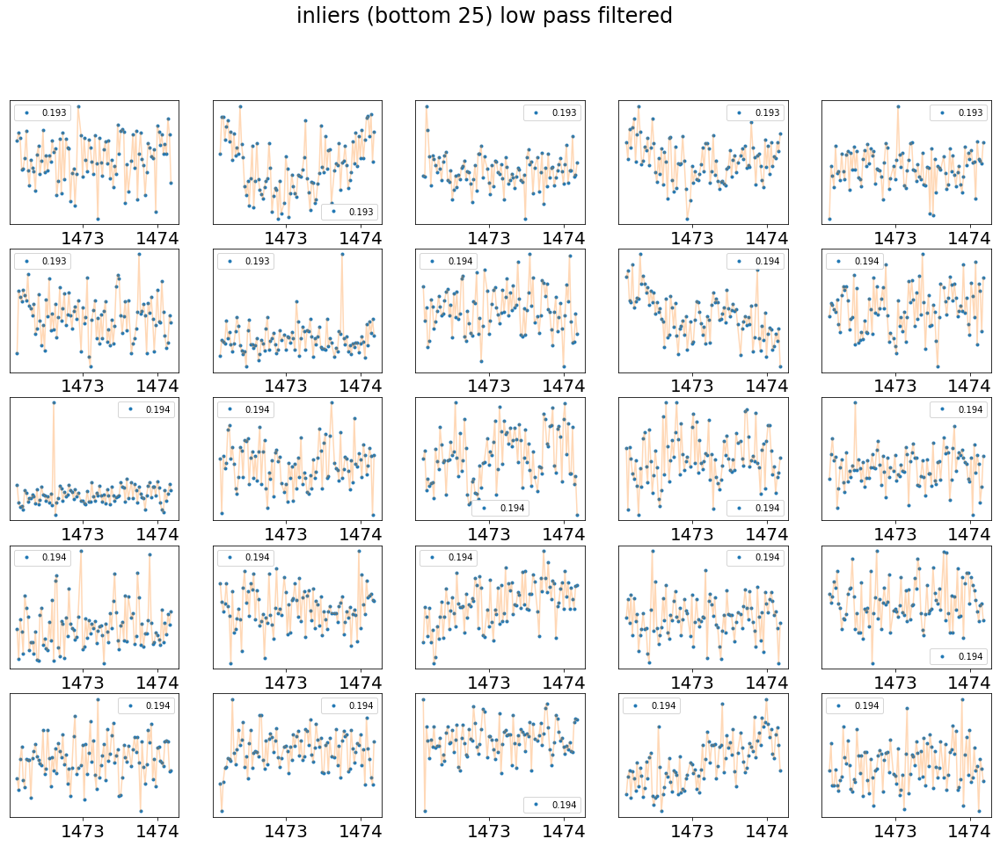

In [64]:
fig = pl.figure(figsize=(20,15))
for j,i in  enumerate(np.argsort(scores_pred_LP)[-25:]):
    ax=fig.add_subplot(5,5,j+1)
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '.', label="%.3f"%scores_pred_LP[i])
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '-', alpha=0.3)
    ax.legend(fontsize=10)
    ax.set_yticks([])    
pl.suptitle("inliers (bottom 25) low pass filtered")
pl.savefig("inliersLP.png")

# power spectrum

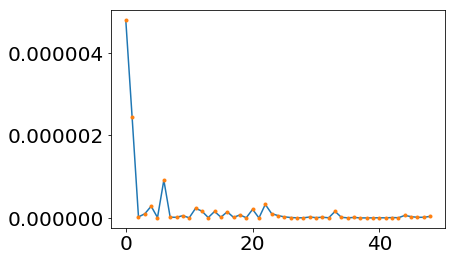

In [65]:
powerspoectrum = np.fft.rfft(lcvsKepLP[:,1,:])
ps = [np.real(powerspoectrum[i])[2:]**2 for i in range(2500)]
pl.plot(ps[1], '-')
pl.plot(ps[1], '.')

In [66]:

clf.fit(ps)#, sample_weight=1.0/(Xfixed[:,2,:])**2)
scores_ps = clf.decision_function(ps)
threshold_ps = stats.scoreatpercentile(scores_ps,
                                100 * 0.1)
y_predPS = clf.predict(ps)


/Users/fbb/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/iforest.py:223: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
/Users/fbb/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/iforest.py:417: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)


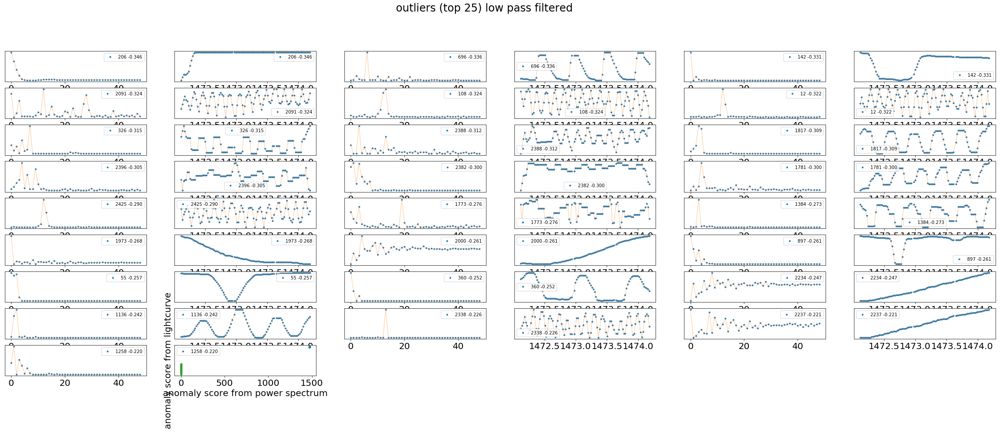

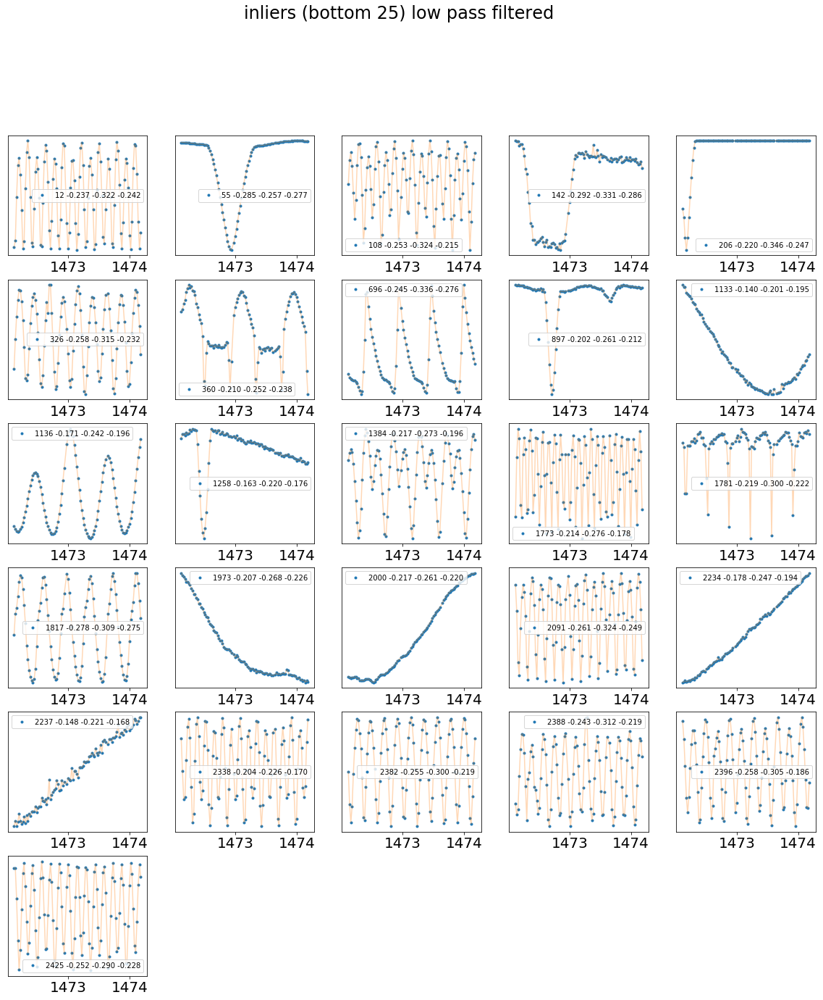

In [67]:
fig = pl.figure(figsize=(40,15))
for j,i in  enumerate(np.argsort(scores_ps)[:25]):
    ax=fig.add_subplot(10,6,j*2+1)
    ax.plot(ps[i], '.', label="%d %.3f"%(i, scores_ps[i]))
    ax.plot(ps[i], '-', alpha=0.3)
    ax.legend(fontsize=10)
    ax.set_yticks([])    
    ax=fig.add_subplot(10,6,j*2+2)
    ax.plot(lcvsKepLP[i, 0], lcvsKepLP[i, 1], '.', label="%d %.3f"%(i, scores_ps[i]))
    ax.plot(lcvsKepLP[i, 0], lcvsKepLP[i, 1], '-', alpha=0.3)
    ax.legend(fontsize=10)
    ax.set_yticks([])    
pl.suptitle("outliers (top 25) low pass filtered")
pl.savefig("outliersNorm.png")

pl.plot(scores_ps, scores_pred_LP, '.')
pl.xlabel("anomaly score from power spectrum")
pl.ylabel("anomaly score from lightcurve")

fig = pl.figure(figsize=(20,25))
j = 0
for i in  range(len(lcvsKep)):
    if scores_ps[i] > -0.2 or scores_pred_LP[i] > 0.2:
        continue
    
    ax=fig.add_subplot(7,5,j+1)
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '.', label="%d %.3f %.3f %.3f"%(i,
        scores_pred_fixed[i], scores_ps[i], scores_pred_LP[i]))
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '-', alpha=0.3)
    ax.legend(fontsize=10)
    ax.set_yticks([])    
    j=j+1
pl.suptitle("inliers (bottom 25) low pass filtered")
pl.savefig("inliersnospikes.png")



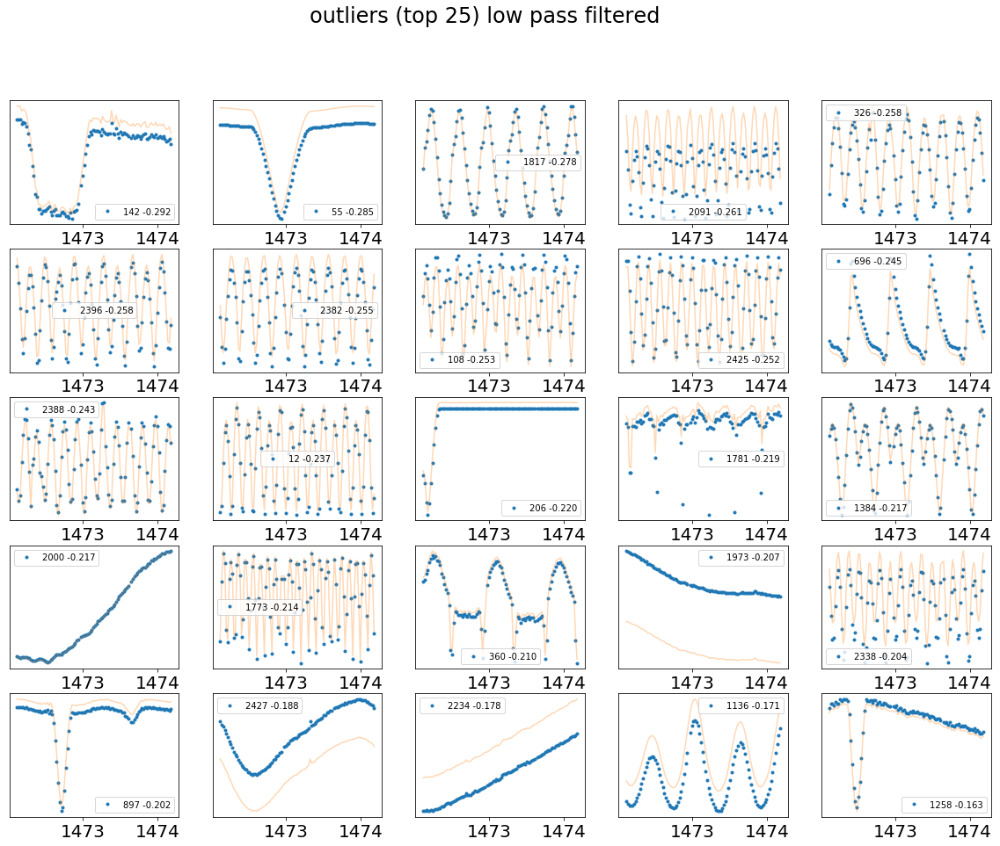

In [68]:
fig = pl.figure(figsize=(20,15))
for j,i in  enumerate(np.argsort(scores_pred_fixed)[:25]):
    ax=fig.add_subplot(5,5,j+1)
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '.', label="%d %.3f"%(i, scores_pred_fixed[i]))
    ax.plot(lcvsKepfixed[i,0], lcvsKepfixed[i,1], '-', alpha=0.3)
    ax.legend(fontsize=10)
    ax.set_yticks([])    
pl.suptitle("outliers (top 25) low pass filtered")
pl.savefig("outliersLP.png")

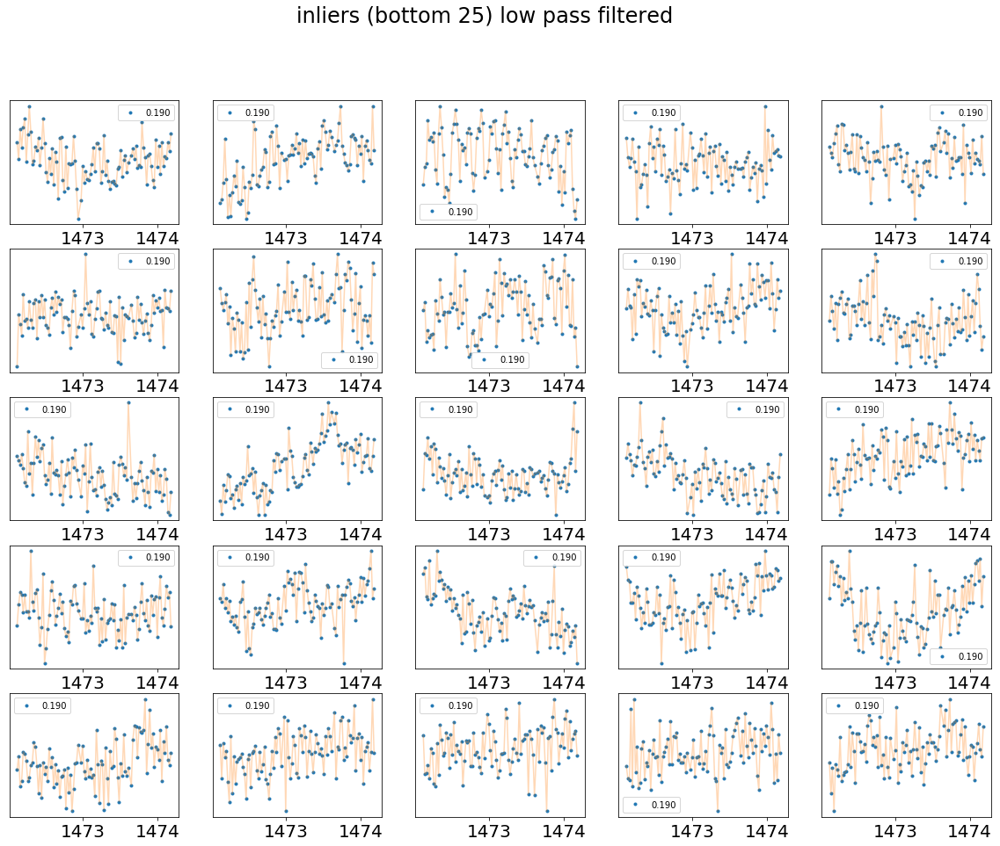

In [69]:
fig = pl.figure(figsize=(20,15))
for j,i in  enumerate(np.argsort(scores_pred_fixed)[-25:]):
    ax=fig.add_subplot(5,5,j+1)
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '.', label="%.3f"%scores_pred_fixed[i])
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '-', alpha=0.3)
    ax.legend(fontsize=10)
    ax.set_yticks([])    
pl.suptitle("inliers (bottom 25) low pass filtered")
pl.savefig("inliersnospikes.png")

(2000, 2000, 2000, (2500,), (2500,))

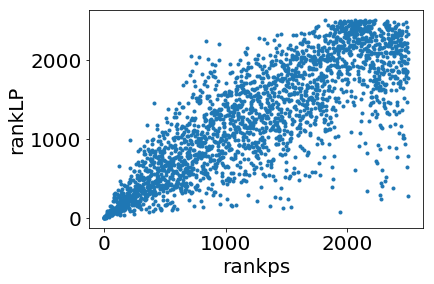

In [70]:
rankps = np.zeros(len(scores_ps), int)
rankps[np.argsort(scores_ps)] = np.arange(len(scores_ps)).astype(int)

rankLP = np.zeros(len(scores_pred_LP), int)
rankLP[np.argsort(scores_pred_LP)] = np.arange(len(scores_pred_LP)).astype(int)
pl.plot(rankps, rankLP, '.')
pl.xlabel('rankps')
pl.ylabel('rankLP')
sum(y_predNorm), sum(y_predLP), sum(y_predfixed), \
scores_pred_Norm.shape, scores_pred_LP.shape

[]

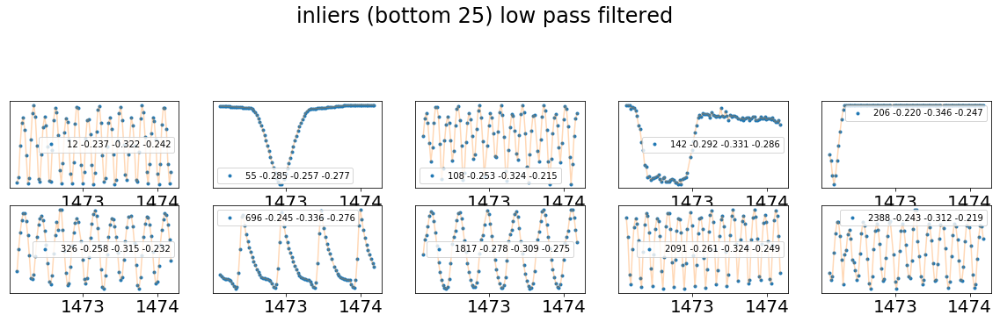

In [71]:
rankstot = rankps * rankLP
((rankps * rankLP) < 100).sum()
j = 0
fig = pl.figure(figsize=(20,15))
for i in  range(len(lcvsKep)):
    if (rankps * rankLP)[i] > 100:
        continue
    
    ax=fig.add_subplot(7,5,j+1)
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '.', label="%d %.3f %.3f %.3f"%(i,
        scores_pred_fixed[i], scores_ps[i], scores_pred_LP[i]))
    ax.plot(lcvsKep[i,0], lcvsKep[i,1], '-', alpha=0.3)
    ax.legend(fontsize=10)
    ax.set_yticks([])    
    j=j+1
pl.suptitle("inliers (bottom 25) low pass filtered")
pl.savefig("inliersnospikes.png")

pl.plot()

In [72]:
ce = np.array([np.sqrt(np.sum(np.diff(x)**2)) for x in lcvsKep[:,1]])
ce.shape

(2500,)

In [73]:
def complexityInvariantD (i,j):
    ce_x = ce[i]
    ce_y = ce[j]
    return np.sqrt(np.sum((lcvsKep[i,1] - lcvsKep[j,1])**2)) *\
        max(ce_x, ce_y) / min(ce_x, ce_y)

In [74]:
complexityInvariantD (611, 611)

0.0

/Users/fbb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log10
  


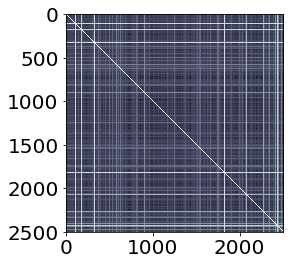

In [75]:
dall = sp.spatial.distance_matrix(lcvsKep[:,1], lcvsKep[:,1])
imshow(np.log10(dall))

In [76]:
cdall = np.asarray([[complexityInvariantD(i, j) 
                 for i in range(2500)] 
                for j in range(2500)])

/Users/fbb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.


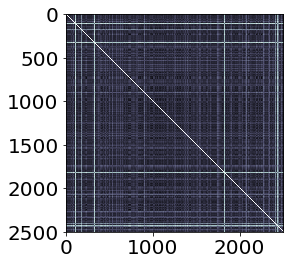

In [77]:
imshow(np.log10(cdall))

In [78]:
sp.stats.pearsonr(cdall.flatten(), dall.flatten())

(0.5597585144383384, 0.0)

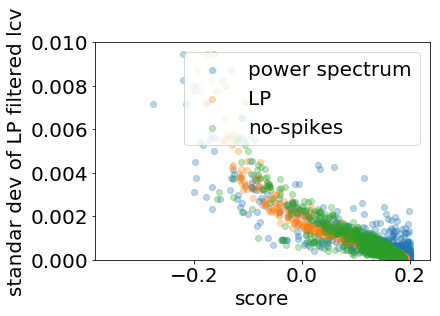

In [79]:
ax = pl.figure().add_subplot(111)
pl.xlabel("score")
pl.ylabel("standar dev of LP filtered lcv")

pl.scatter(scores_ps, (lcvsKepLP[:,:][:,1]).std(axis=1), alpha=0.3,
          label="power spectrum")
pl.scatter(scores_pred_LP, (lcvsKepLP[:,:][:,1]).std(axis=1), alpha=0.3, label="LP")
pl.scatter(scores_pred_fixed, (lcvsKepLP[:,:][:,1]).std(axis=1), alpha=0.3,
          label="no-spikes")
#ax.set_yscale("log")
ax.set_ylim(0,0.01)
ax.legend()
pl.savefig("scoreVSsnrLPFedIsolation.pdf")

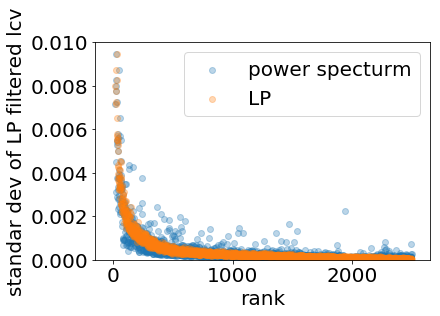

In [80]:
ax = pl.figure().add_subplot(111)
pl.xlabel("rank")
pl.ylabel("standar dev of LP filtered lcv")

pl.scatter(rankps, (lcvsKepLP[:,:][:,1]).std(axis=1), alpha=0.3,
          label="power specturm")
pl.scatter(rankLP, (lcvsKepLP[:,:][:,1]).std(axis=1), alpha=0.3,
          label="LP")
#ax.set_yscale("log")
#pl.scatter(rankstot, (lcvsKepLP[:,:][:,1]).std(axis=1), alpha=0.3,
#          label="product")
ax.set_ylim(0,0.01)
ax.legend()
pl.savefig("ranksVSsnrLPFedIsolation.pdf")


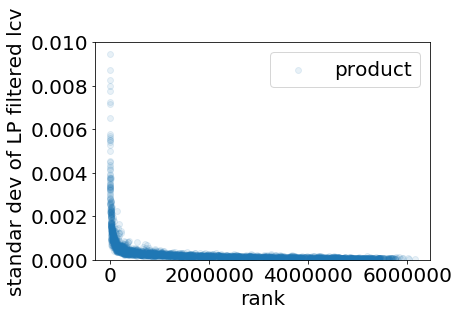

In [81]:
ax = pl.figure().add_subplot(111)
pl.xlabel("rank")
pl.ylabel("standar dev of LP filtered lcv")

#ax.set_yscale("log")
pl.scatter(rankstot, (lcvsKepLP[:,:][:,1]).std(axis=1), alpha=0.1,
          label="product")
ax.set_ylim(0,0.01)
ax.legend()
pl.savefig("RankprodVSsnrFedIsolation.pdf")
